In [1]:
#KENARDESEN KODLANIRKEN PİRAMİT GÖRSELLERİNİ KULLANMA
#GÖRÜNTÜNÜN 3 SEVİYE PİRAMİTİ ALINDI
#HER SEVİYE İÇİN AYRI HOG KODLAMASI VE CROSS KOLERASYON YAPILDI
#HER SEVİYE İÇİN IoU HESAPLANDI.
#HESAPLANAN IoU LAR ŞU ŞEKİLDEDİR;

#ORJİNAL GÖRÜNTÜ IoU : 0.6477 (KENAR DESENDE BULMUŞTUK)
#SEVİYE 1 IoU : 0.5342
#SEVİYE 2 IoU : 0.5152
#SEVİYE 3 IoU : 0.4607

#GÖRÜNTÜNÜN BOYUTU DÜŞTÜKÇE GÖRÜNTÜ KALİTESİNE BAĞLI OLARAK IoU SUDA DÜŞMEKTEDİR

In [2]:
#MODELLEME AŞAMASI

In [3]:
#KÜTÜPHANELERİ İMPORT EDİYORUZ

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import numpy as np
from kymatio import Scattering2D
from skimage import measure

In [5]:
#GÖRSEL VE LABELLERİ ÖN İŞLEMDEN GEÇİRİLEREK GÖRSELLEŞTİRİLİYOR

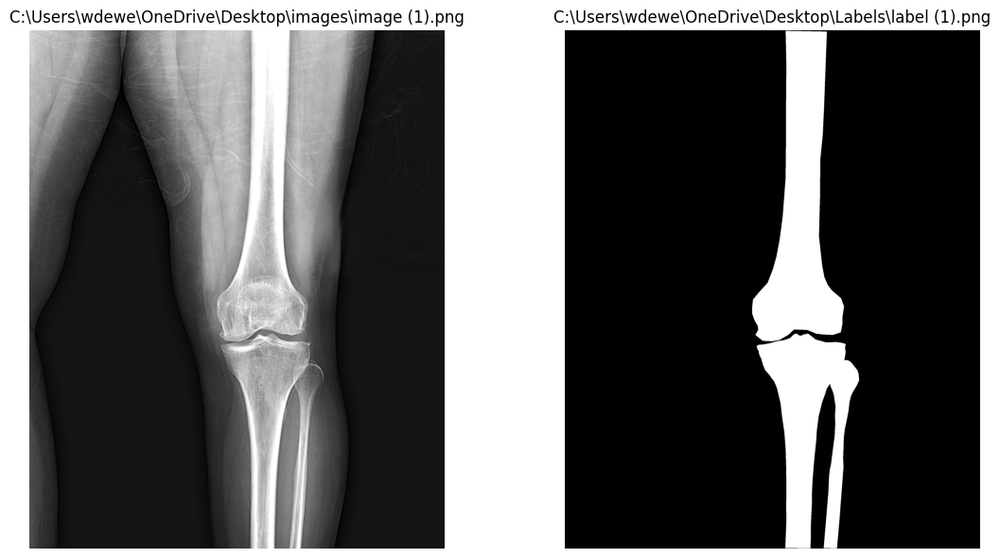

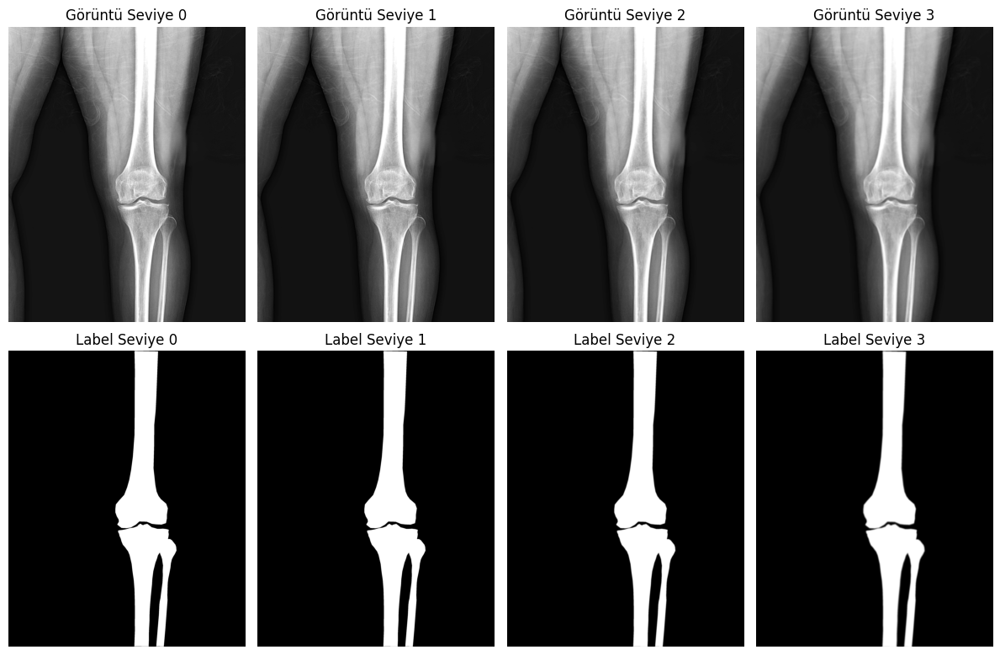


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
img_level_0, img_level_1, img_level_2, img_level_3 = img_pyramid
label_level_0, label_level_1, label_level_2, label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [8]:
#YAZDIRMA FONKSİYONU

In [3]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius=10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color=(255, 255, 0), thickness=2)                                

    if EdgePatchs is not None: 
        # Img üzerine Patch çiz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x, y, PatchSize) in enumerate(EdgePatchs):  # (x, y, PatchSize) bekleniyor
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            cv2.rectangle(output_img, top_left, bottom_right, (0, 0, 255), 2)
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()


In [90]:
#GAUSS PİRAMİT 1. SEVİYE
#HER SEVİYEYİ AYRI AYRI YAPIP IoU ları karşılaştırılacak

In [91]:
#BOUNDARY İLE KENAR NOKTALARI İŞARETLENİYOR.

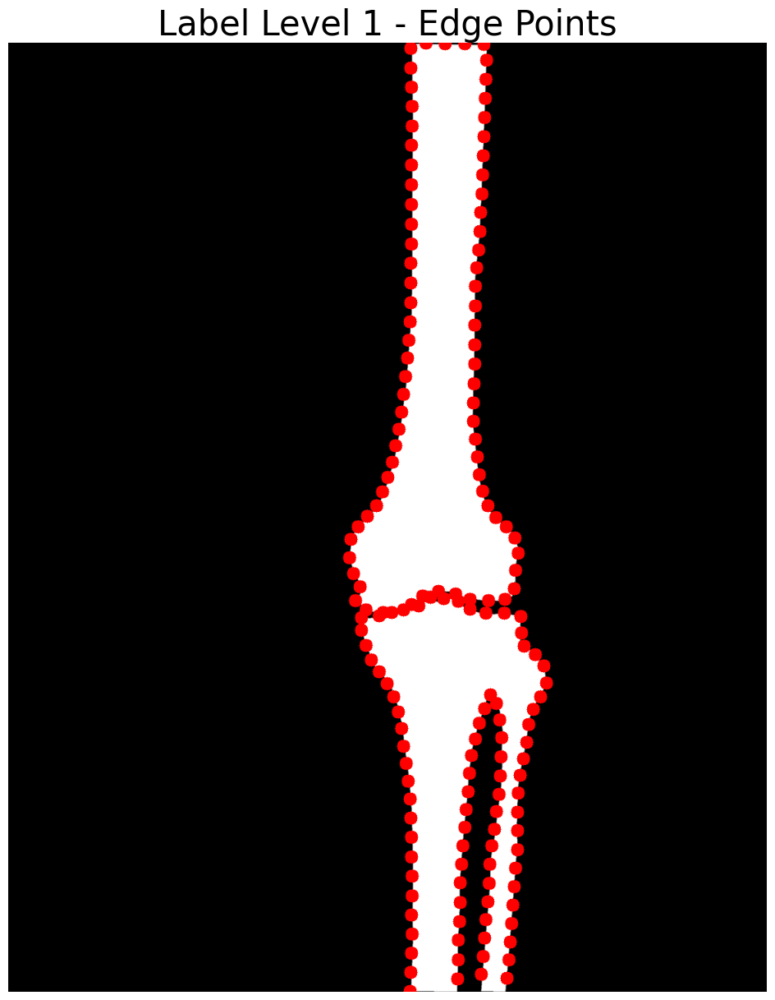

In [4]:
def GetLabelEdgePoints(img, sparsity_factor=1, circle_radius=10, draw=False, title=None):
    contours = measure.find_contours(img, level=0.5)
    # Tüm sınır piksellerini birleştir
    boundary_points = np.vstack(contours)
    
    # Sparsity factor ile seyrekleştirme
    if sparsity_factor > 1:
        boundary_points = boundary_points[::sparsity_factor]
        
    if draw:
        Drawing(img, EdgePoints=boundary_points, circle_radius=circle_radius, title=title)

    return boundary_points.astype(int)

# Kenar Gorsellerini Kodla
title = "Label Level 1 - Edge Points"
img_EdgePoints = GetLabelEdgePoints(label_level_1, sparsity_factor=30, circle_radius=10, draw=True, title=title)


In [ ]:
#PACHLER ALINIYOR

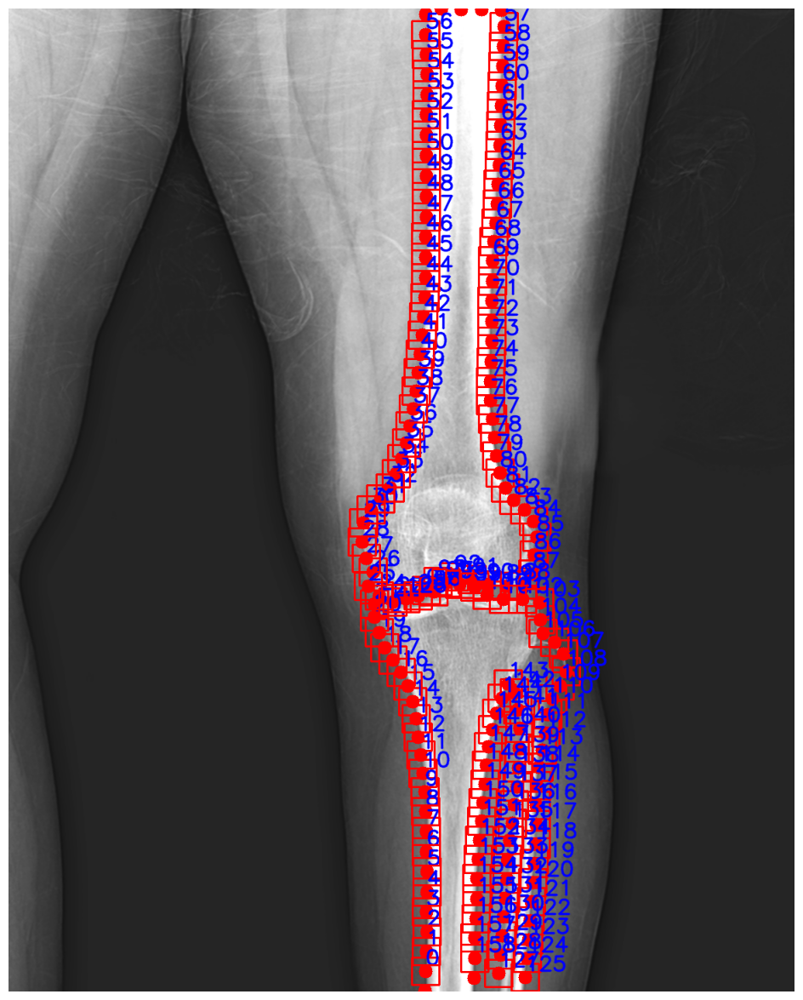

In [6]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]
        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x, y, PatchSize])  # Açı bilgisini çıkardık
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs=EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo

# img_EdgePoints --> img_EdgePatchs 
img_EdgePatchs, img_EdgePatchsInfo = GetEdgePatchs(img_level_1, img_EdgePoints, PatchSize=20, draw=True)  # M = 2*PatchSize + 1,  MxM = 101x101

In [ ]:
#PACHLER GÖRSELLEŞTİRİLİYOR

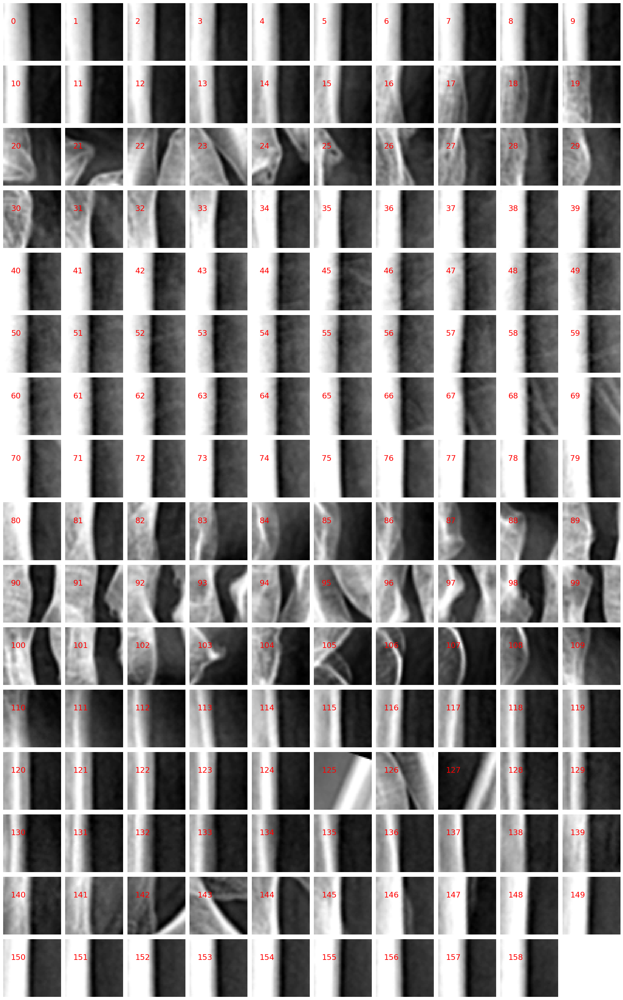

In [7]:
def DisplayPatches(EdgePatchs, max_cols=10):
    # Toplam patch sayısı
    num_patches = len(EdgePatchs)
    
    # Sütun sayısı (max_cols ile sınırlı)
    cols = min(max_cols, num_patches)
    
    # Satır sayısını hesapla
    rows = math.ceil(num_patches / cols)
    
    # Şekil oluşturma
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = np.array(axes).reshape(-1)  # Tek boyutlu diziye dönüştür
    
    for i, ax in enumerate(axes):
        if i < num_patches:
            ax.imshow(EdgePatchs[i], cmap='gray')
            ax.text(5, 10, str(i), color='red', fontsize=18, ha='left', va='top')
            ax.axis('off')
        else:
            ax.axis('off')  # Fazla eksenleri kapat
    
    plt.tight_layout()
    plt.show()


# img_EdgePatchs gorsellerini tek figurede gor (donmusmuyu kontrol et)
DisplayPatches(img_EdgePatchs)

In [34]:
#TÜM PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK

In [8]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

        # Debugging: HOG özelliklerini yazdırma
        print(f"Patch {i}: HOG Özellikleri: {features[:5]}...")  # İlk 5 özelliği yazdır

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    # Dosya yolu oluşturuluyor
    try:
        # Dizin yoksa oluşturuluyor
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        
        # HOG özellikleri ve koordinatları kaydediliyor
        np.savez(output_path, features=all_features, coords=all_coords)
        print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")
    except Exception as e:
        # Kaydetme sırasında oluşan hatayı yazdır
        print(f"Kaydetme sırasında hata oluştu: {e}")


# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_1  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\hog_features_with_coords.npz"  # Masaüstü yolu

# Hata ayıklamak için görüntülerin ve patch'lerin doğru şekilde geçildiğini kontrol et
print(f"Patch sayısı: {len(img_EdgePatchs)}")
save_hog_features_with_coords(img_EdgePatchs, img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(img_EdgePatchs)} patch HOG ile kodlandı.")


Patch sayısı: 159
Patch 0: HOG Özellikleri: [0.351417   0.02174982 0.         0.         0.00499473]...
Patch 1: HOG Özellikleri: [0.3177063  0.00798798 0.         0.         0.0023141 ]...
Patch 2: HOG Özellikleri: [3.4716135e-01 3.8501292e-02 1.8402759e-04 0.0000000e+00 4.2899540e-03]...
Patch 3: HOG Özellikleri: [0.34795442 0.02568587 0.00182067 0.         0.0107446 ]...
Patch 4: HOG Özellikleri: [0.30145228 0.00461807 0.         0.         0.00179475]...
Patch 5: HOG Özellikleri: [0.32522923 0.0066893  0.         0.         0.00156938]...
Patch 6: HOG Özellikleri: [0.24649741 0.00328164 0.         0.         0.00242138]...
Patch 7: HOG Özellikleri: [0.29585937 0.00892822 0.         0.         0.00275127]...
Patch 8: HOG Özellikleri: [0.3445812  0.01068174 0.         0.         0.00562066]...
Patch 9: HOG Özellikleri: [0.22770841 0.01287405 0.         0.         0.00864379]...
Patch 10: HOG Özellikleri: [0.3034046  0.01029238 0.         0.         0.00398543]...
Patch 11: HOG Özelli

In [41]:
#TEST AŞAMASI

In [67]:
#TEST GÖRSELİNİ ÖN İŞLEMDEN GEÇİRİP GÖRÜNTÜLEDİK
#TEST İÇİN 9. GÖRSELİ KULLANIYORUZ
#HER SEVİYEYİ KENDİ BOYUTUYLA TEST İŞLEMİNE TUTACAĞIZ

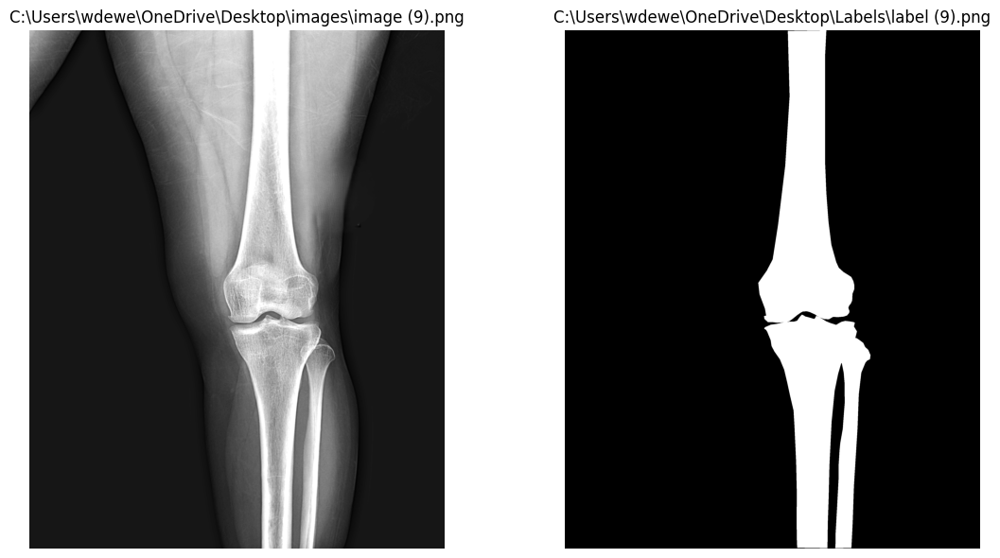

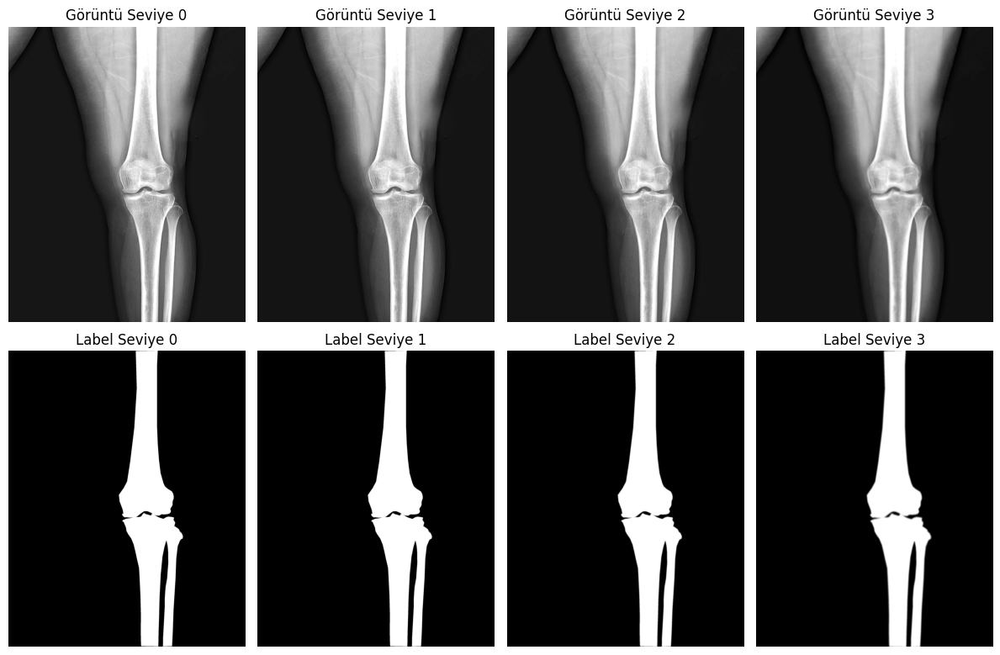


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (9).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
test_img_level_0, test_img_level_1, test_img_level_2, test_img_level_3 = img_pyramid
test_label_level_0, test_label_level_1, test_label_level_2, test_label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [69]:
#CANNY İLE KENAR NOKTASI ÇIKARMA

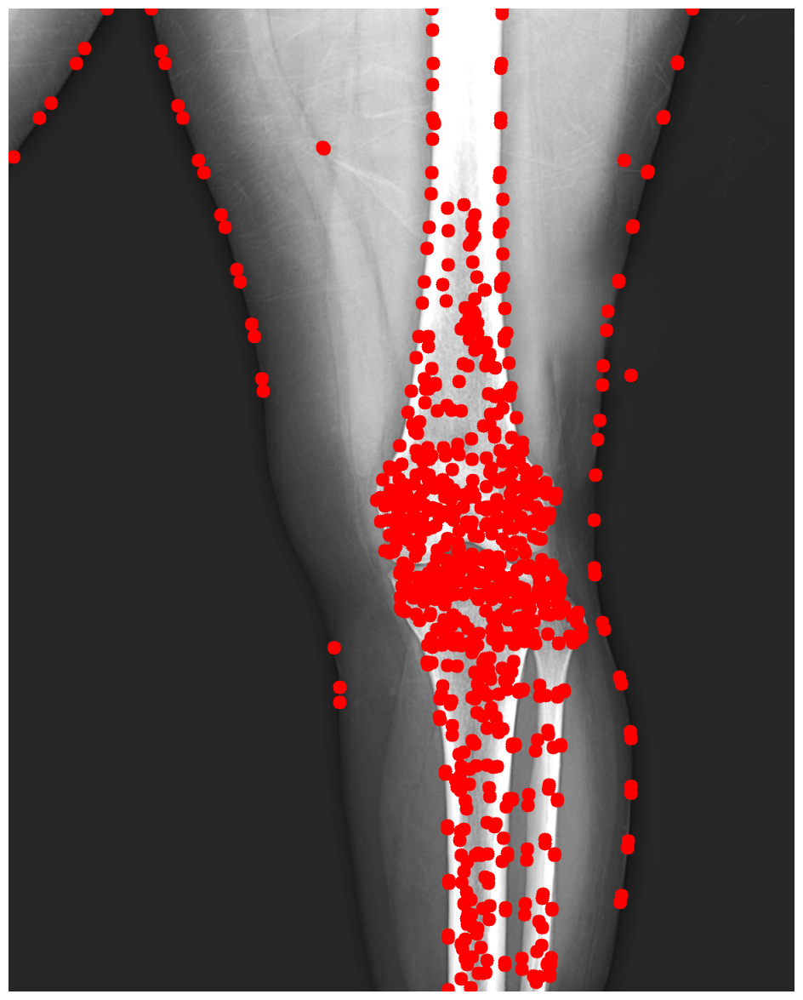

In [10]:
def GetCannyEdgePoints(img, sparsity_factor=1, draw=False):
    blurimg = cv2.GaussianBlur(img, (5, 5), 0)
    edges = cv2.Canny(blurimg, 25, 75)
    CannyEdgePoints, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    EdgePoints = []
    for ObjPoints in CannyEdgePoints:
        EdgePoints = EdgePoints + [(point[0][1], point[0][0]) for i, point in enumerate(ObjPoints) if i % sparsity_factor == 0]

    if draw:
        Drawing(img, EdgePoints=EdgePoints)

    return EdgePoints

test_img_EdgePoints = GetCannyEdgePoints(test_img_level_1, sparsity_factor=80, draw=True)   # EdgePoints --> [p,2] --> (y,x)

In [71]:
#BU NOKTALARDAN PACHLER ALDIK

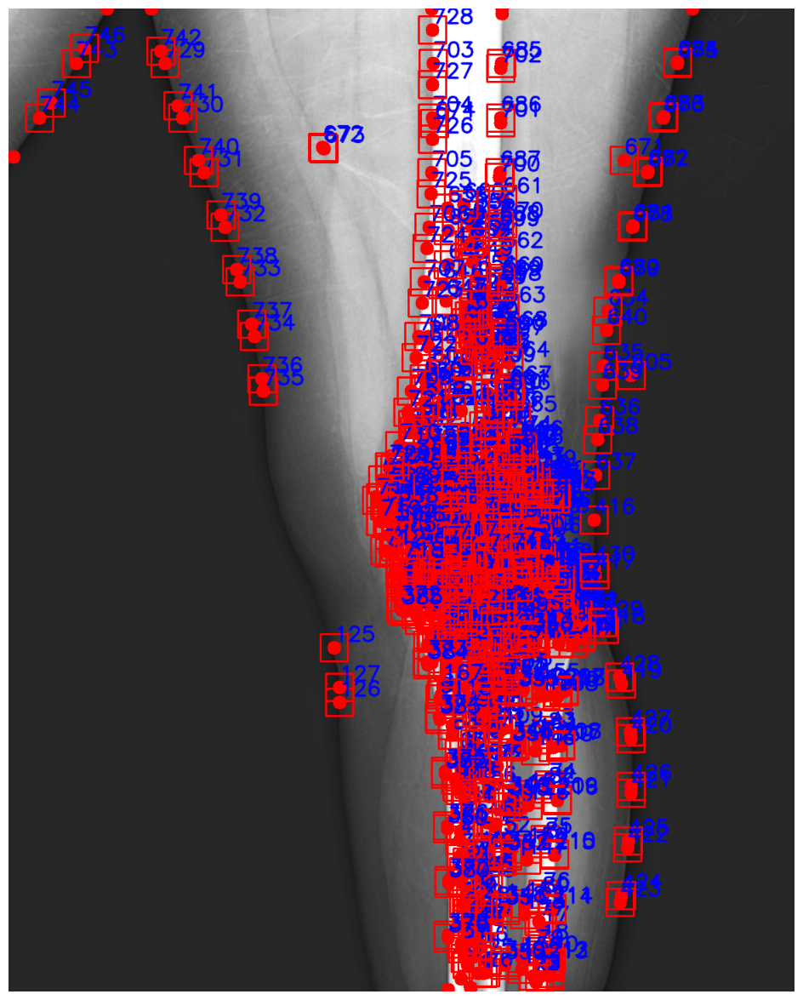

In [12]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]
        EdgePatchs.append(EdgePatch)
        # Açı bilgisini çıkardık - sadece x, y ve PatchSize bilgilerini saklıyoruz
        EdgePatchsInfo.append([x, y, PatchSize])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs=EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo

# Test görüntüsü için patch'leri al
test_img_EdgePatchs, test_img_EdgePatchsInfo = GetEdgePatchs(test_img_level_1, test_img_EdgePoints, PatchSize=20, draw=True)

In [75]:
#ALDIĞIMIZ PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK (Toplam 747 patch HOG ile kodlandı..)

In [14]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.savez(output_path, features=all_features, coords=all_coords)
    print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")

# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_1  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\test_image9_hog_features_with_coords.npz"
save_hog_features_with_coords(test_img_EdgePatchs, test_img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(test_img_EdgePatchs)} patch HOG ile kodlandı.")


HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\test_image9_hog_features_with_coords.npz
Toplam 747 patch HOG ile kodlandı.


In [76]:
#DOSYADA Kİ KAYITLI KLASÖRÜN ANAHTARINI SORGULAYAN KOD

In [15]:
# Dosyanın içeriğini kontrol etme
hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\test_image9_hog_features_with_coords.npz")
print(hog_data.files)  # Dosyanın içinde hangi anahtarların bulunduğunu gösterir


['features', 'coords']


In [78]:
#HOG KODLARINI CROSS KOLERASYONLA KARŞILAŞTIRDIK.

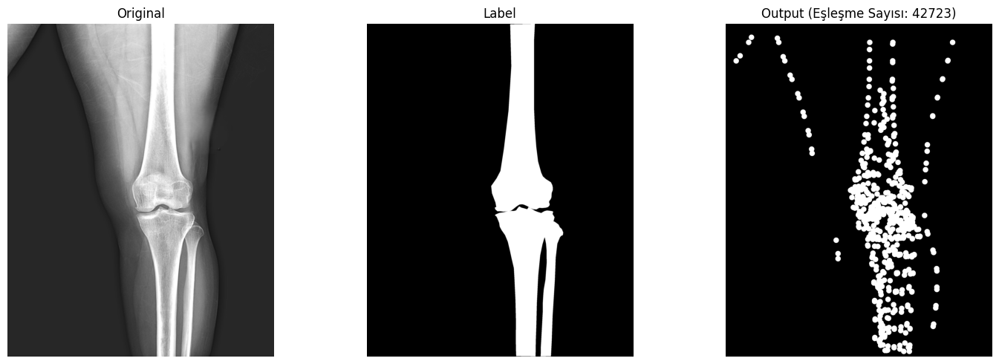

In [16]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Optimize edilmiş çapraz korelasyon fonksiyonu
def compute_cross_correlation_optimized(vectors1, vectors2):
    return 1 - cdist(vectors1, vectors2, metric='correlation')  # Korelasyon mesafesi

# HDD'deki referans HOG vektörlerini yükleme
stored_hog_vectors = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\hog_features_with_coords.npz")['features']

# Test ve etiket görüntülerini daha önceki kodlardan yükleme
test_image = test_img_level_1
label_image = test_label_level_1

# Test HOG vektörlerini ve koordinatlarını yükleme
test_hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_1\test_image9_hog_features_with_coords.npz")
test_hog_vectors = test_hog_data['features']
test_coords = test_hog_data['coords']

# Korelasyon işlemleri ve görselleştirme
plt.figure(figsize=(15, 5))
output_images = []  # Sonuç görsellerini tutmak için bir liste oluştur

# Çapraz korelasyonu hızlı hesaplama
correlations_matrix = compute_cross_correlation_optimized(test_hog_vectors, stored_hog_vectors)
threshold = 0.30
high_correlation_indices = np.argwhere(correlations_matrix >= threshold)

# Yüksek korelasyon eşleşmelerini işleme
output_img = np.zeros_like(test_image)  # Siyah bir görüntü oluşturma
matching_coords_count = 0
for test_idx, stored_idx in high_correlation_indices:
    coord = test_coords[test_idx]
    x, y = int(coord[0]), int(coord[1])
    cv2.circle(output_img, (x, y), 12, (255, 255, 255), -1)
    matching_coords_count += 1

# Orijinal görüntüler ve sonuç görselleştirme
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
plt.title("Label")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.title(f"Output (Eşleşme Sayısı: {matching_coords_count})")
plt.axis('off')

plt.tight_layout()
plt.show()

# Sonuç görsellerini bir değişkende tutma
final_output_image = output_img  # Son görseli tutan değişken


In [85]:
#FİNAL GÖRÜNTÜSÜNE MORFOLOJİK MÜDAHALELER

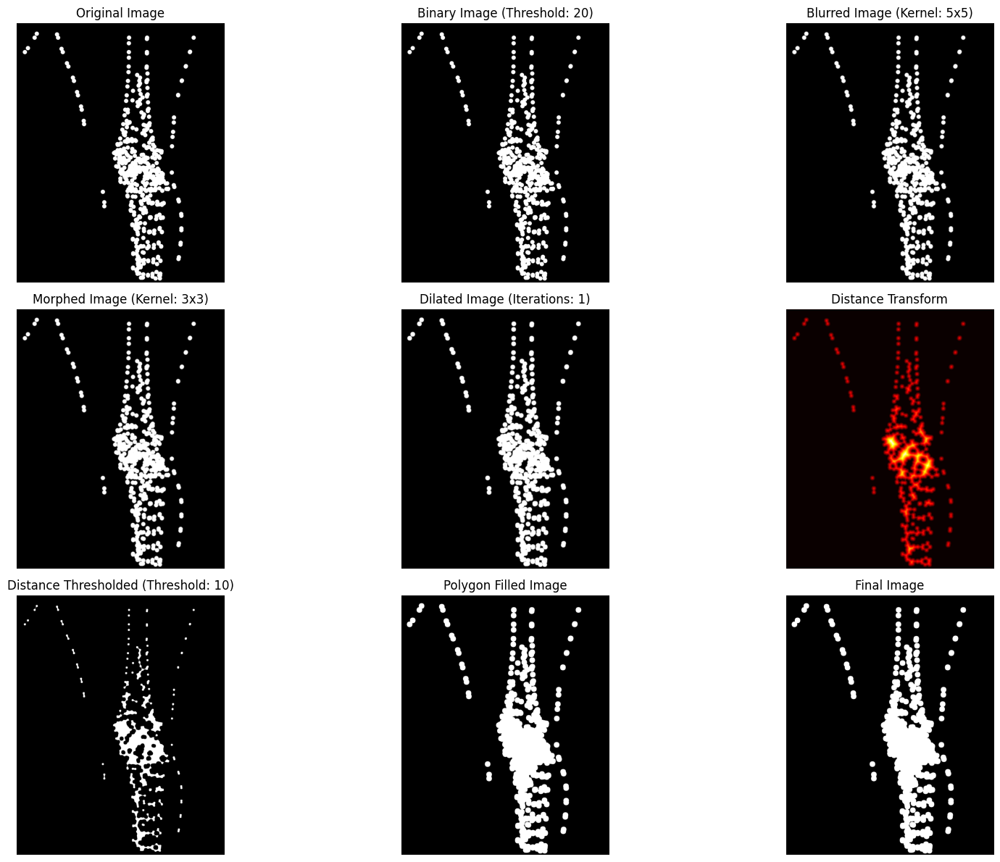

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüyü yükleme ve gri tonlamaya dönüştürme
if isinstance(final_output_image, np.ndarray):
    if len(final_output_image.shape) == 3:  # Eğer görüntü renkli ise gri tonlamaya dönüştür
        image = cv2.cvtColor(final_output_image, cv2.COLOR_BGR2GRAY)
    else:
        image = final_output_image  # Zaten gri tonlamalı
else:
    image = cv2.imread(final_output_image, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise ValueError("Görüntü yüklenemedi. Lütfen doğru yolu kontrol edin veya geçerli bir NumPy dizisi kullanın.")

# --- Ayarlanabilir Eşik Değerleri ---
threshold_value_initial = 20  # İlk eşik değeri (örneğin kenar tespiti için)
blur_kernel_size = 5          # Bulanıklaştırma için kernel boyutu
morph_kernel_size = 3         # Morfolojik işlemler için kernel boyutu
dilate_iterations = 1         # Dilatasyon iterasyon sayısı
distance_threshold_value = 10 # Distance transform için eşik değeri

# --- Kenarları Tespit Etme ---
_, binary_image = cv2.threshold(image, threshold_value_initial, 255, cv2.THRESH_BINARY)

# --- Bulanıklaştırma ---
blurred_image = cv2.GaussianBlur(binary_image, (blur_kernel_size, blur_kernel_size), 0)

# --- Morfolojik İşlemler: Closing ---
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (morph_kernel_size, morph_kernel_size))
morphed_image = cv2.morphologyEx(blurred_image, cv2.MORPH_CLOSE, kernel)

# --- Dilatasyon ile Noktaları Birleştirme ---
dilated_image = cv2.dilate(morphed_image, kernel, iterations=dilate_iterations)

# --- Distance Transform ---
distance_transform = cv2.distanceTransform(dilated_image, cv2.DIST_L2, 5)
_, distance_thresholded = cv2.threshold(distance_transform, distance_threshold_value, 255, cv2.THRESH_BINARY)
distance_thresholded = distance_thresholded.astype(np.uint8)

# --- Bağlantılı Bileşen Analizi ---
num_labels, labels_im = cv2.connectedComponents(distance_thresholded)

# --- Konturları Bulma ve Poligon Oluşturma ---
contours, _ = cv2.findContours(dilated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
polygon_image = np.zeros_like(dilated_image)

for contour in contours:
    # Konturların içini beyaz yap (poligon şekli)
    cv2.fillPoly(polygon_image, [contour], 255)

# Poligon içindeki alanları beyaz yap
final_image = cv2.bitwise_or(dilated_image, polygon_image)

# --- Sonuçları Görselleştirme ---
plt.figure(figsize=(18, 12))

# Orijinal Görüntü
plt.subplot(3, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# İlk Eşiklenmiş Görüntü
plt.subplot(3, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title(f"Binary Image (Threshold: {threshold_value_initial})")
plt.axis('off')

# Bulanıklaştırılmış Görüntü
plt.subplot(3, 3, 3)
plt.imshow(blurred_image, cmap='gray')
plt.title(f"Blurred Image (Kernel: {blur_kernel_size}x{blur_kernel_size})")
plt.axis('off')

# Morfolojik İşlemler Sonrası Görüntü
plt.subplot(3, 3, 4)
plt.imshow(morphed_image, cmap='gray')
plt.title(f"Morphed Image (Kernel: {morph_kernel_size}x{morph_kernel_size})")
plt.axis('off')

# Dilatasyon Sonrası Görüntü
plt.subplot(3, 3, 5)
plt.imshow(dilated_image, cmap='gray')
plt.title(f"Dilated Image (Iterations: {dilate_iterations})")
plt.axis('off')

# Distance Transform Sonrası Görüntü
plt.subplot(3, 3, 6)
plt.imshow(distance_transform, cmap='hot')
plt.title("Distance Transform")
plt.axis('off')

# Distance Threshold Sonrası Görüntü
plt.subplot(3, 3, 7)
plt.imshow(distance_thresholded, cmap='gray')
plt.title(f"Distance Thresholded (Threshold: {distance_threshold_value})")
plt.axis('off')

# Poligon İçinde Beyaz Alanlar
plt.subplot(3, 3, 8)
plt.imshow(polygon_image, cmap='gray')
plt.title("Polygon Filled Image")
plt.axis('off')

# Final Görüntü
plt.subplot(3, 3, 9)
plt.imshow(final_image, cmap='gray')
plt.title("Final Image")
plt.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
#IoU HESAPLAMA

Final Image IoU: 0.5342


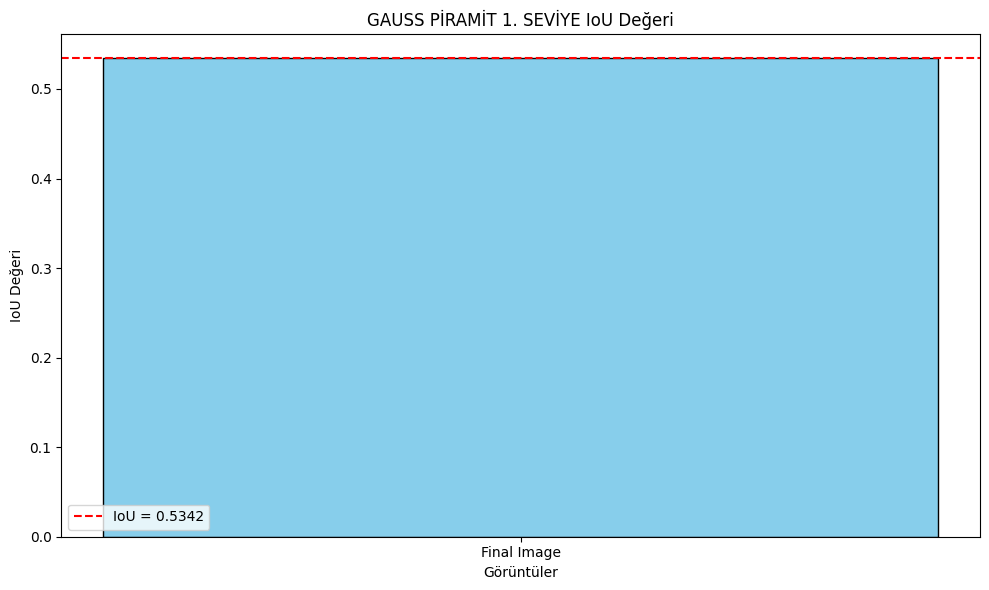

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# IoU hesaplama fonksiyonu
def calculate_iou(predicted_image, label_image):
    # İkili görüntüye dönüştürme (thresholding)
    _, pred_binary = cv2.threshold(predicted_image, 127, 255, cv2.THRESH_BINARY)
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)
    
    # Kesişim ve birleşim
    intersection = np.logical_and(pred_binary > 0, label_binary > 0).sum()
    union = np.logical_or(pred_binary > 0, label_binary > 0).sum()
    
    # IoU hesaplama
    iou = intersection / union if union != 0 else 0
    return iou

# final_image'i kontrol etme
if final_image is None:
    print("Final görüntüsü yüklenemedi!")
else:
    # Eğer final_image zaten gri tonlamalıysa, doğrudan eşikleme yapabilirsiniz
    _, final_binary = cv2.threshold(final_image, 127, 255, cv2.THRESH_BINARY)

# Etiket görüntüsünü yükleme ve kontrol etme
label_image = test_label_level_1  # Etiket görüntüsünün yolu buraya girilmeli
if label_image is None:
    print("Etiket görüntüsü yüklenemedi!")
else:
    # Etiket görüntüsünü ikili hale getirme
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)


# IoU hesaplama
if final_image is not None and label_image is not None:
    iou = calculate_iou(final_binary, label_binary)
    print(f"Final Image IoU: {iou:.4f}")

    # IoU Grafik Çıktısı
    plt.figure(figsize=(10, 6))
    plt.bar(["Final Image"], [iou], color='skyblue', edgecolor='black')
    plt.axhline(iou, color='red', linestyle='--', label=f"IoU = {iou:.4f}")
    plt.xlabel('Görüntüler')
    plt.ylabel('IoU Değeri')
    plt.title('GAUSS PİRAMİT 1. SEVİYE IoU Değeri')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [92]:
##############################################################################################################################################

In [ ]:
#GAUSS PİRAMİT 2. SEVİYE
#HER SEVİYEYİ AYRI AYRI YAPIP IoU ları karşılaştırılacak

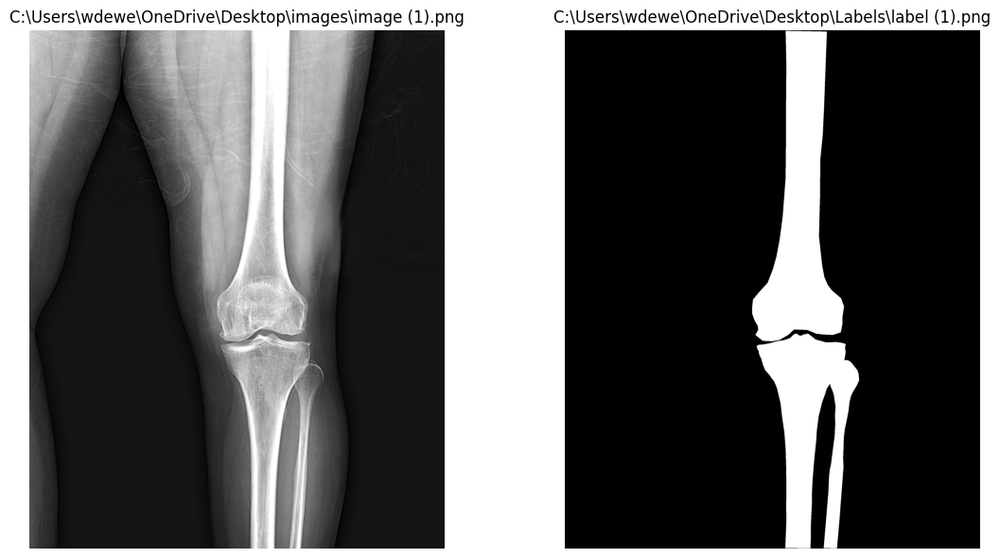

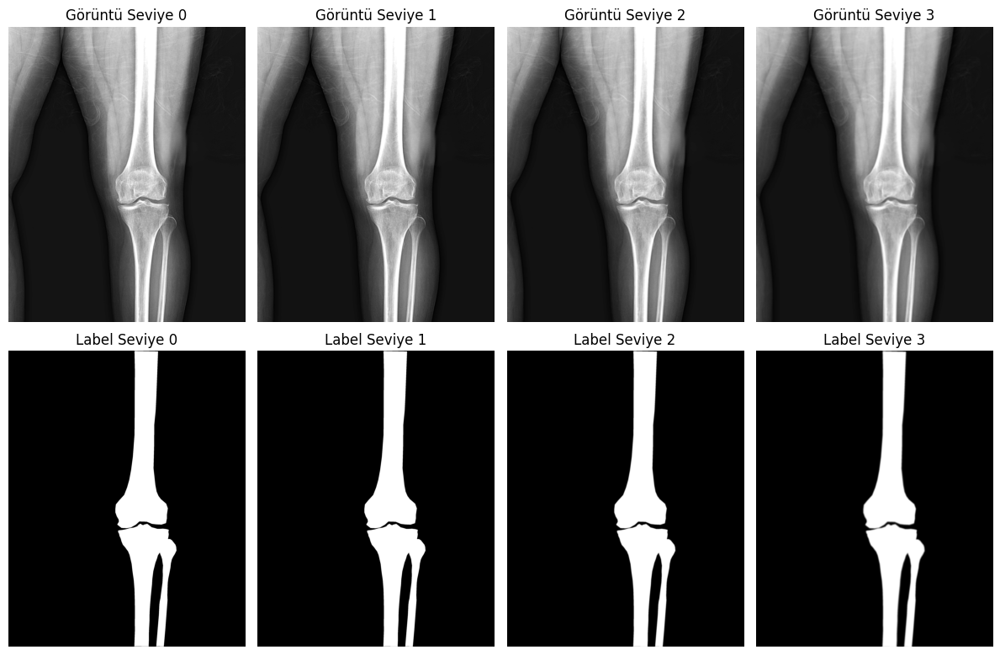


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
img_level_0, img_level_1, img_level_2, img_level_3 = img_pyramid
label_level_0, label_level_1, label_level_2, label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [94]:
#YAZDIRMA FONKSİYONU

In [20]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius=10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color=(255, 255, 0), thickness=2)                                

    if EdgePatchs is not None: 
        # Img üzerine Patch çiz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x, y, PatchSize) in enumerate(EdgePatchs):  # (x, y, PatchSize) bekleniyor
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            cv2.rectangle(output_img, top_left, bottom_right, (0, 0, 255), 2)
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()


In [96]:
#GAUSS PİRAMİT 2. SEVİYE
#HER SEVİYEYİ AYRI AYRI YAPIP IoU ları karşılaştırılacak

In [101]:
#BOUNDARY İLE KENAR NOKTALARINI BULDUK

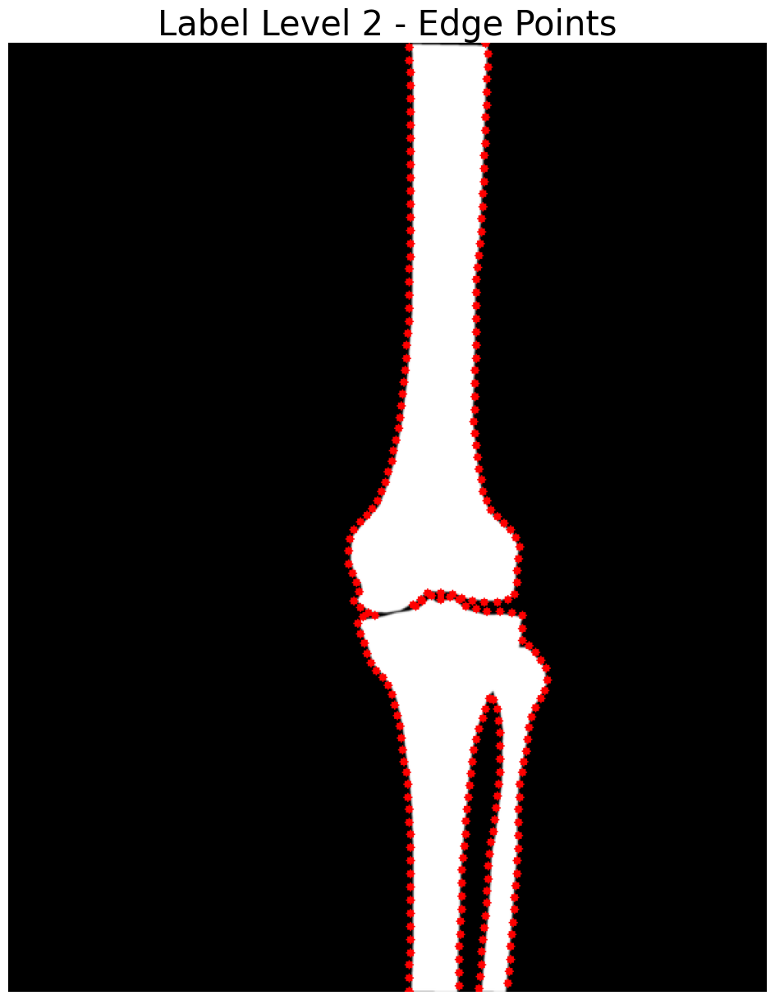

In [21]:
def GetLabelEdgePoints(img, sparsity_factor=1, circle_radius=10, draw=False, title=None):
    contours = measure.find_contours(img, level=0.5)
    # Tüm sınır piksellerini birleştir
    boundary_points = np.vstack(contours)
    
    # Sparsity factor ile seyrekleştirme
    if sparsity_factor > 1:
        boundary_points = boundary_points[::sparsity_factor]
        
    if draw:
        Drawing(img, EdgePoints=boundary_points, circle_radius=circle_radius, title=title)

    return boundary_points.astype(int)

# Kenar Gorsellerini Kodla
title = "Label Level 2 - Edge Points"
img_EdgePoints = GetLabelEdgePoints(label_level_2, sparsity_factor=10, circle_radius=3, draw=True, title=title)


In [ ]:
#PACHLERİNİ ALIYORUZ

In [22]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title="Drawing", circle_radius=5):
    plt.figure(figsize=(12, 12))
    plt.imshow(img, cmap='gray')
    plt.title(title)
    
    # Noktalar için çizim
    if EdgePoints is not None:
        for y, x in EdgePoints:
            plt.scatter(x, y, c='r', s=10)
    
    # Çizgiler için çizim
    if EdgeLines is not None:
        for (x1, y1), (x2, y2) in EdgeLines:
            plt.plot([x1, x2], [y1, y2], 'b-', lw=1.5)
    
    # Patch'ler için çizim
    if EdgePatchs is not None:
        for k, (x, y, PatchSize, angle) in enumerate(EdgePatchs):  # Dört elemanlı tuple'a uyum
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            rect = plt.Rectangle(top_left, 2 * PatchSize, 2 * PatchSize, linewidth=1, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)

    plt.axis("off")
    plt.show()


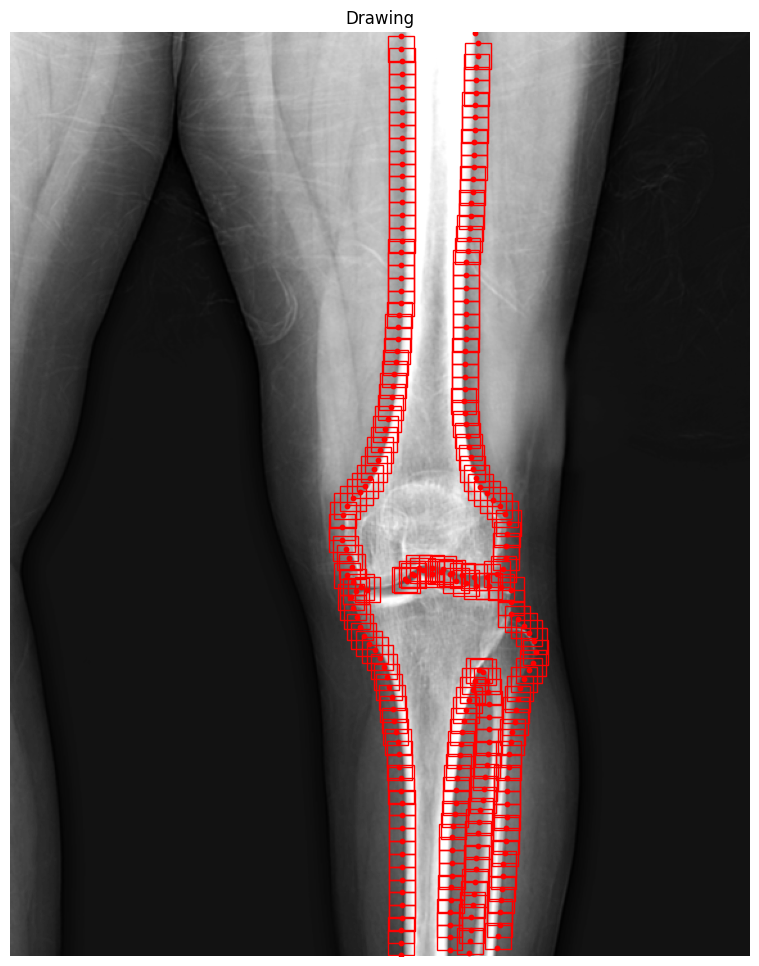

In [23]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo

# img_EdgePoints --> img_EdgePatchs 
img_EdgePatchs, img_EdgePatchsInfo = GetEdgePatchs(img_level_2, img_EdgePoints, PatchSize=10, draw=True)  # M = 2*PatchSize + 1,  MxM = 101x101


In [111]:
#PACHLERİ GÖRSELLEŞTİRİYORUZ

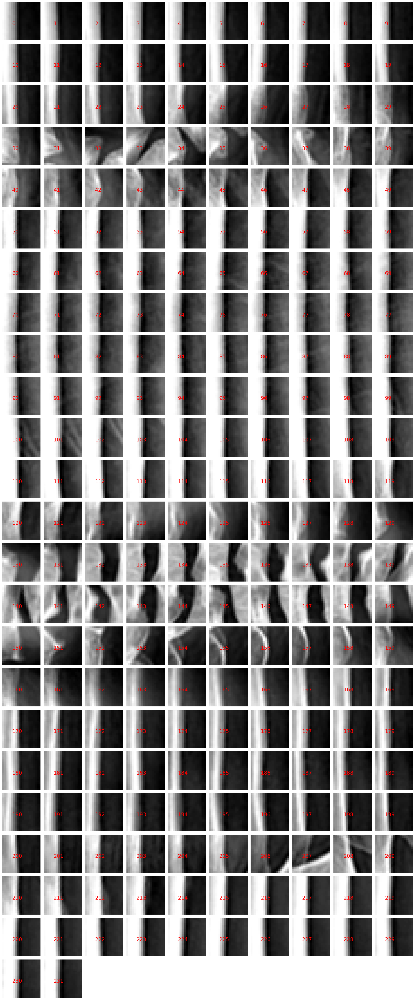

In [24]:
def DisplayPatches(EdgePatchs, max_cols=10):
    # Toplam patch sayısı
    num_patches = len(EdgePatchs)
    
    # Sütun sayısı (max_cols ile sınırlı)
    cols = min(max_cols, num_patches)
    
    # Satır sayısını hesapla
    rows = math.ceil(num_patches / cols)
    
    # Şekil oluşturma
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = np.array(axes).reshape(-1)  # Tek boyutlu diziye dönüştür
    
    for i, ax in enumerate(axes):
        if i < num_patches:
            ax.imshow(EdgePatchs[i], cmap='gray')
            ax.text(5, 10, str(i), color='red', fontsize=18, ha='left', va='top')
            ax.axis('off')
        else:
            ax.axis('off')  # Fazla eksenleri kapat
    
    plt.tight_layout()
    plt.show()


# img_EdgePatchs gorsellerini tek figurede gor (donmusmuyu kontrol et)
DisplayPatches(img_EdgePatchs)

In [112]:
#TÜM PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK

In [25]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

        # Debugging: HOG özelliklerini yazdırma
        #print(f"Patch {i}: HOG Özellikleri: {features[:5]}...")  # İlk 5 özelliği yazdır

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    # Dosya yolu oluşturuluyor
    try:
        # Dizin yoksa oluşturuluyor
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        
        # HOG özellikleri ve koordinatları kaydediliyor
        np.savez(output_path, features=all_features, coords=all_coords)
        print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")
    except Exception as e:
        # Kaydetme sırasında oluşan hatayı yazdır
        print(f"Kaydetme sırasında hata oluştu: {e}")


# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_2  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\hog_features_with_coords.npz"  # Masaüstü yolu

# Hata ayıklamak için görüntülerin ve patch'lerin doğru şekilde geçildiğini kontrol et
print(f"Patch sayısı: {len(img_EdgePatchs)}")
save_hog_features_with_coords(img_EdgePatchs, img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(img_EdgePatchs)} patch HOG ile kodlandı.")


Patch sayısı: 232
HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\hog_features_with_coords.npz
Toplam 232 patch HOG ile kodlandı.


In [114]:
#TEST AŞAMASI

In [115]:
#TEST GÖRSELİNİ ÖN İŞLEMDEN GEÇİRİP GÖRÜNTÜLEDİK
#TEST İÇİN 9. GÖRSELİ KULLANIYORUZ
#HER SEVİYEYİ KENDİ BOYUTUYLA TEST İŞLEMİNE TUTACAĞIZ (2. SEVİYE)

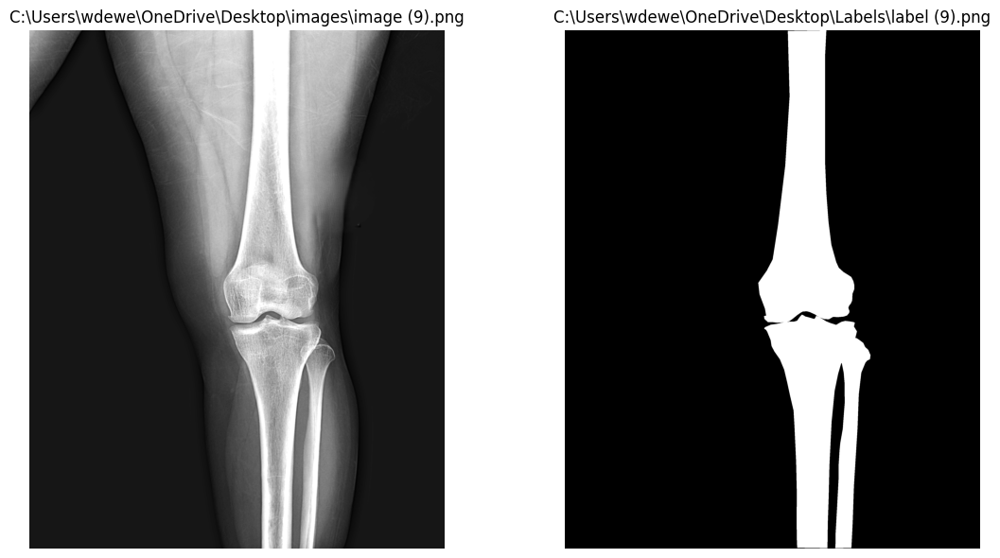

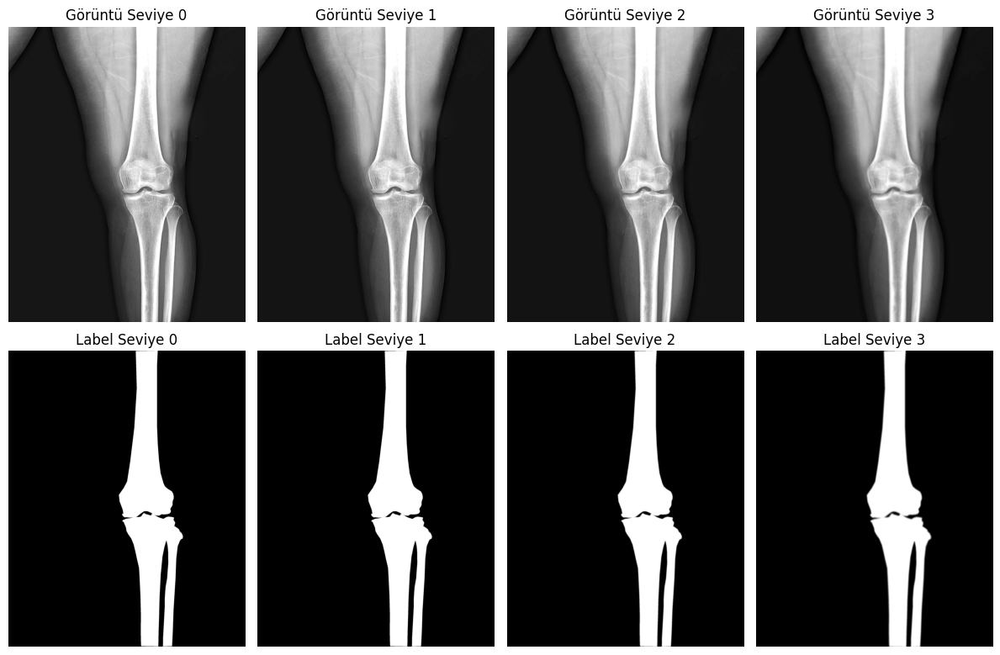


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (9).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
test_img_level_0, test_img_level_1, test_img_level_2, test_img_level_3 = img_pyramid
test_label_level_0, test_label_level_1, test_label_level_2, test_label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [117]:
#CANNY İLE KENAR NOKTASI ÇIKARMA

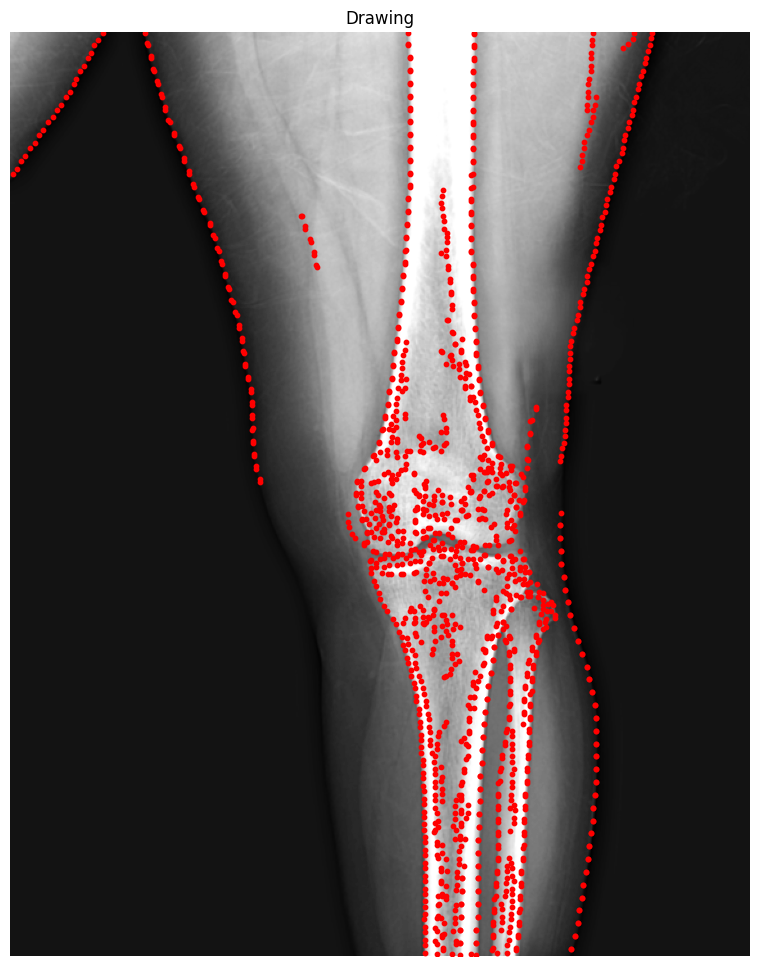

In [27]:
def GetCannyEdgePoints(img, sparsity_factor=1, draw=False):
    blurimg = cv2.GaussianBlur(img, (5, 5), 0)
    edges = cv2.Canny(blurimg, 25, 75)
    CannyEdgePoints, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    EdgePoints = []
    for ObjPoints in CannyEdgePoints:
        EdgePoints = EdgePoints + [(point[0][1], point[0][0]) for i, point in enumerate(ObjPoints) if i % sparsity_factor == 0]

    if draw:
        Drawing(img, EdgePoints=EdgePoints)

    return EdgePoints

test_img_EdgePoints = GetCannyEdgePoints(test_img_level_2, sparsity_factor=10, draw=True)   # EdgePoints --> [p,2] --> (y,x)

In [120]:
#BU NOKTALARDAN PACHLER ALDIK

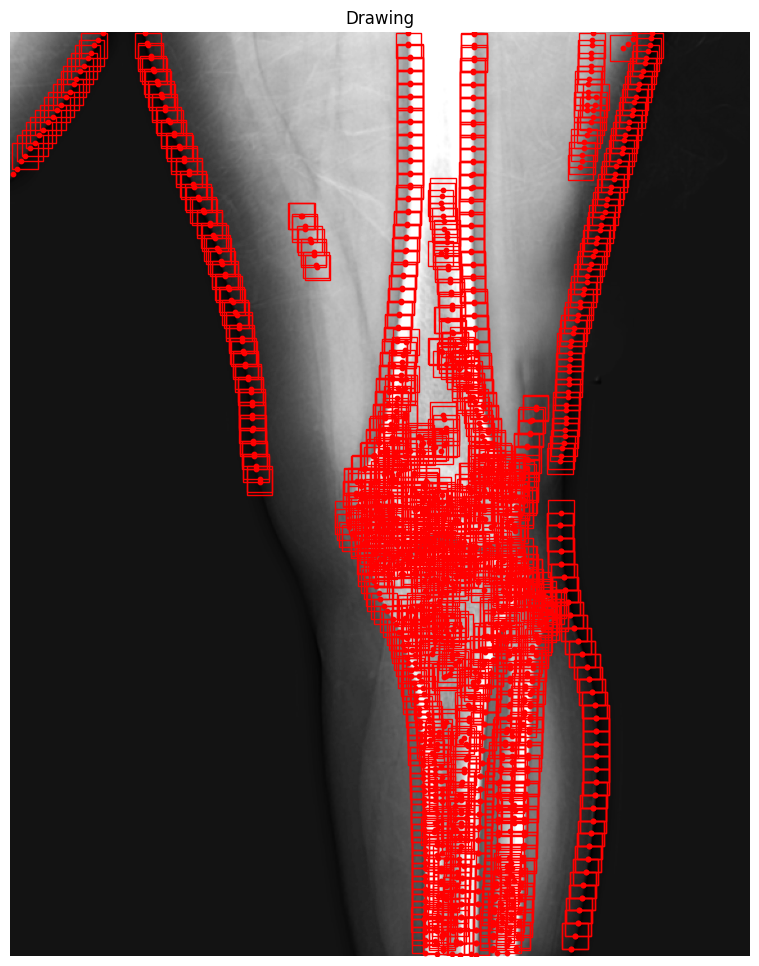

In [28]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo


test_img_EdgePatchs, test_img_EdgePatchsInfo = GetEdgePatchs(test_img_level_2, test_img_EdgePoints, PatchSize=10, draw=True)

In [40]:
#ALDIĞIMIZ PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK (Toplam 1386 patch HOG ile kodlandı.)

In [29]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.savez(output_path, features=all_features, coords=all_coords)
    print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")

# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_2  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\test_image9_hog_features_with_coords.npz"
save_hog_features_with_coords(test_img_EdgePatchs, test_img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(test_img_EdgePatchs)} patch HOG ile kodlandı.")


HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\test_image9_hog_features_with_coords.npz
Toplam 1386 patch HOG ile kodlandı.


In [124]:
#DOSYADA Kİ KAYITLI KLASÖRÜN ANAHTARINI SORGULAYAN KOD

In [30]:
# Dosyanın içeriğini kontrol etme
hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\test_image9_hog_features_with_coords.npz")
print(hog_data.files)  # Dosyanın içinde hangi anahtarların bulunduğunu gösterir


['features', 'coords']


In [126]:
#HOG KODLARINI CROSS KOLERASYONLA KARŞILAŞTIRDIK.

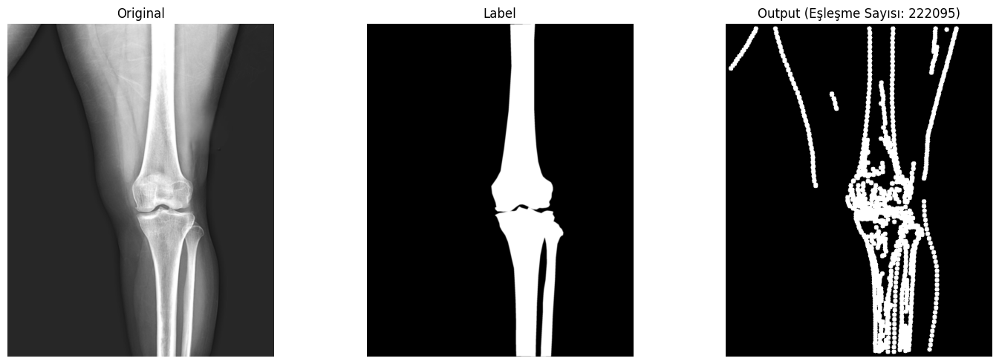

In [31]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Optimize edilmiş çapraz korelasyon fonksiyonu
def compute_cross_correlation_optimized(vectors1, vectors2):
    return 1 - cdist(vectors1, vectors2, metric='correlation')  # Korelasyon mesafesi

# HDD'deki referans HOG vektörlerini yükleme
stored_hog_vectors = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\hog_features_with_coords.npz")['features']

# Test ve etiket görüntülerini daha önceki kodlardan yükleme
test_image = test_img_level_2
label_image = test_label_level_2

# Test HOG vektörlerini ve koordinatlarını yükleme
test_hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_2\test_image9_hog_features_with_coords.npz")
test_hog_vectors = test_hog_data['features']
test_coords = test_hog_data['coords']

# Korelasyon işlemleri ve görselleştirme
plt.figure(figsize=(15, 5))
output_images = []  # Sonuç görsellerini tutmak için bir liste oluştur

# Çapraz korelasyonu hızlı hesaplama
correlations_matrix = compute_cross_correlation_optimized(test_hog_vectors, stored_hog_vectors)
threshold = 0.50
high_correlation_indices = np.argwhere(correlations_matrix >= threshold)

# Yüksek korelasyon eşleşmelerini işleme
output_img = np.zeros_like(test_image)  # Siyah bir görüntü oluşturma
matching_coords_count = 0
for test_idx, stored_idx in high_correlation_indices:
    coord = test_coords[test_idx]
    x, y = int(coord[0]), int(coord[1])
    cv2.circle(output_img, (x, y), 5, (255, 255, 255), -1)
    matching_coords_count += 1

# Orijinal görüntüler ve sonuç görselleştirme
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
plt.title("Label")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.title(f"Output (Eşleşme Sayısı: {matching_coords_count})")
plt.axis('off')

plt.tight_layout()
plt.show()

# Sonuç görsellerini bir değişkende tutma
final_output_image = output_img  # Son görseli tutan değişken


In [135]:
#FİNAL GÖRÜNTÜSÜNE MORFOLOJİK MÜDAHALELER

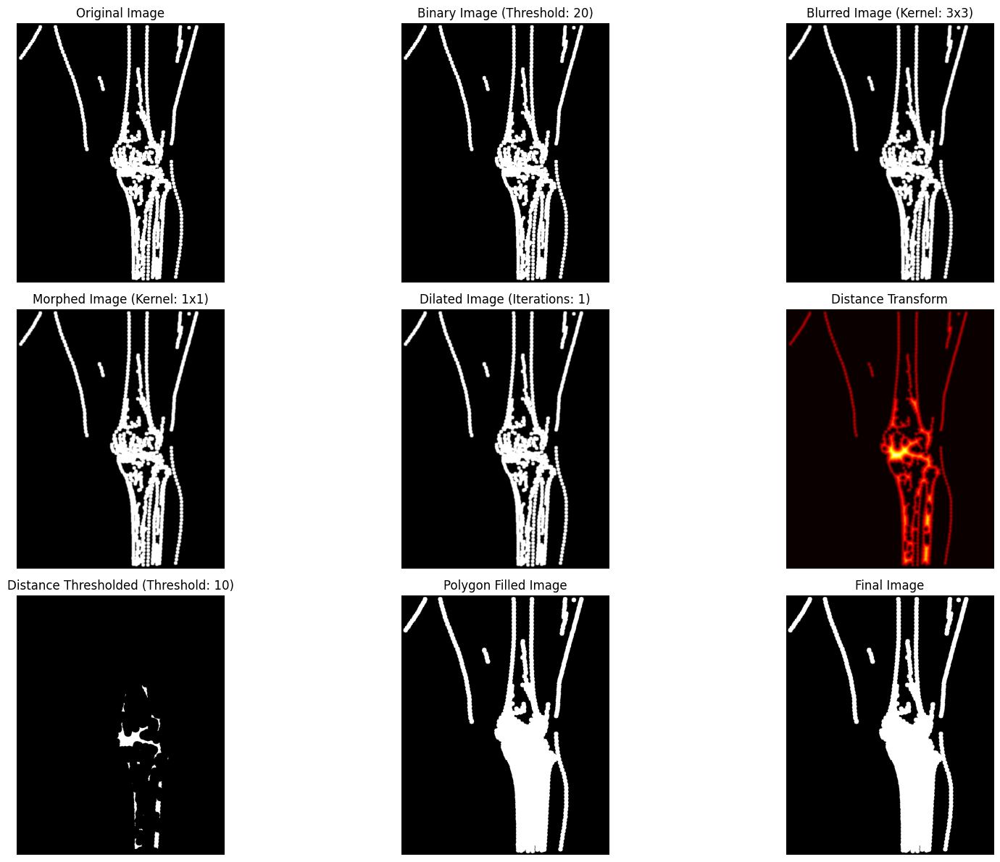

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüyü yükleme ve gri tonlamaya dönüştürme
if isinstance(final_output_image, np.ndarray):
    if len(final_output_image.shape) == 3:  # Eğer görüntü renkli ise gri tonlamaya dönüştür
        image = cv2.cvtColor(final_output_image, cv2.COLOR_BGR2GRAY)
    else:
        image = final_output_image  # Zaten gri tonlamalı
else:
    image = cv2.imread(final_output_image, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise ValueError("Görüntü yüklenemedi. Lütfen doğru yolu kontrol edin veya geçerli bir NumPy dizisi kullanın.")

# --- Ayarlanabilir Eşik Değerleri ---
threshold_value_initial = 20  # İlk eşik değeri (örneğin kenar tespiti için)
blur_kernel_size = 3          # Bulanıklaştırma için kernel boyutu
morph_kernel_size = 1         # Morfolojik işlemler için kernel boyutu
dilate_iterations = 1         # Dilatasyon iterasyon sayısı
distance_threshold_value = 10 # Distance transform için eşik değeri

# --- Kenarları Tespit Etme ---
_, binary_image = cv2.threshold(image, threshold_value_initial, 255, cv2.THRESH_BINARY)

# --- Bulanıklaştırma ---
blurred_image = cv2.GaussianBlur(binary_image, (blur_kernel_size, blur_kernel_size), 0)

# --- Morfolojik İşlemler: Closing ---
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (morph_kernel_size, morph_kernel_size))
morphed_image = cv2.morphologyEx(blurred_image, cv2.MORPH_CLOSE, kernel)

# --- Dilatasyon ile Noktaları Birleştirme ---
dilated_image = cv2.dilate(morphed_image, kernel, iterations=dilate_iterations)

# --- Distance Transform ---
distance_transform = cv2.distanceTransform(dilated_image, cv2.DIST_L2, 5)
_, distance_thresholded = cv2.threshold(distance_transform, distance_threshold_value, 255, cv2.THRESH_BINARY)
distance_thresholded = distance_thresholded.astype(np.uint8)

# --- Bağlantılı Bileşen Analizi ---
num_labels, labels_im = cv2.connectedComponents(distance_thresholded)

# --- Konturları Bulma ve Poligon Oluşturma ---
contours, _ = cv2.findContours(dilated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
polygon_image = np.zeros_like(dilated_image)

for contour in contours:
    # Konturların içini beyaz yap (poligon şekli)
    cv2.fillPoly(polygon_image, [contour], 255)

# Poligon içindeki alanları beyaz yap
final_image = cv2.bitwise_or(dilated_image, polygon_image)

# --- Sonuçları Görselleştirme ---
plt.figure(figsize=(18, 12))

# Orijinal Görüntü
plt.subplot(3, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# İlk Eşiklenmiş Görüntü
plt.subplot(3, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title(f"Binary Image (Threshold: {threshold_value_initial})")
plt.axis('off')

# Bulanıklaştırılmış Görüntü
plt.subplot(3, 3, 3)
plt.imshow(blurred_image, cmap='gray')
plt.title(f"Blurred Image (Kernel: {blur_kernel_size}x{blur_kernel_size})")
plt.axis('off')

# Morfolojik İşlemler Sonrası Görüntü
plt.subplot(3, 3, 4)
plt.imshow(morphed_image, cmap='gray')
plt.title(f"Morphed Image (Kernel: {morph_kernel_size}x{morph_kernel_size})")
plt.axis('off')

# Dilatasyon Sonrası Görüntü
plt.subplot(3, 3, 5)
plt.imshow(dilated_image, cmap='gray')
plt.title(f"Dilated Image (Iterations: {dilate_iterations})")
plt.axis('off')

# Distance Transform Sonrası Görüntü
plt.subplot(3, 3, 6)
plt.imshow(distance_transform, cmap='hot')
plt.title("Distance Transform")
plt.axis('off')

# Distance Threshold Sonrası Görüntü
plt.subplot(3, 3, 7)
plt.imshow(distance_thresholded, cmap='gray')
plt.title(f"Distance Thresholded (Threshold: {distance_threshold_value})")
plt.axis('off')

# Poligon İçinde Beyaz Alanlar
plt.subplot(3, 3, 8)
plt.imshow(polygon_image, cmap='gray')
plt.title("Polygon Filled Image")
plt.axis('off')

# Final Görüntü
plt.subplot(3, 3, 9)
plt.imshow(final_image, cmap='gray')
plt.title("Final Image")
plt.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
#IoU HESAPLAMA

Final Image IoU: 0.5152


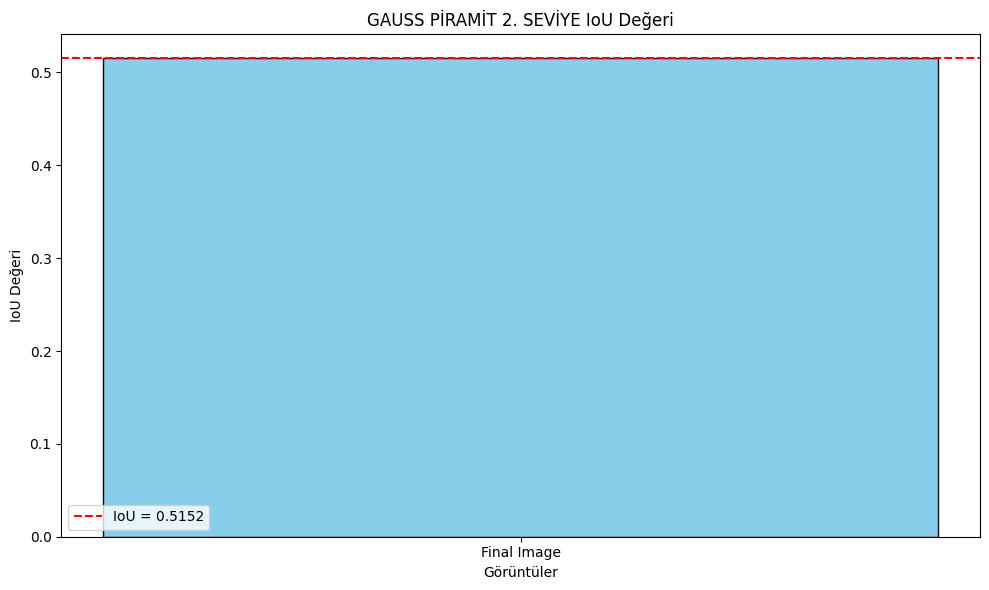

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# IoU hesaplama fonksiyonu
def calculate_iou(predicted_image, label_image):
    # İkili görüntüye dönüştürme (thresholding)
    _, pred_binary = cv2.threshold(predicted_image, 127, 255, cv2.THRESH_BINARY)
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)
    
    # Kesişim ve birleşim
    intersection = np.logical_and(pred_binary > 0, label_binary > 0).sum()
    union = np.logical_or(pred_binary > 0, label_binary > 0).sum()
    
    # IoU hesaplama
    iou = intersection / union if union != 0 else 0
    return iou

# final_image'i kontrol etme
if final_image is None:
    print("Final görüntüsü yüklenemedi!")
else:
    # Eğer final_image zaten gri tonlamalıysa, doğrudan eşikleme yapabilirsiniz
    _, final_binary = cv2.threshold(final_image, 127, 255, cv2.THRESH_BINARY)

# Etiket görüntüsünü yükleme ve kontrol etme
label_image = test_label_level_2  # Etiket görüntüsünün yolu buraya girilmeli
if label_image is None:
    print("Etiket görüntüsü yüklenemedi!")
else:
    # Etiket görüntüsünü ikili hale getirme
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)


# IoU hesaplama
if final_image is not None and label_image is not None:
    iou = calculate_iou(final_binary, label_binary)
    print(f"Final Image IoU: {iou:.4f}")

    # IoU Grafik Çıktısı
    plt.figure(figsize=(10, 6))
    plt.bar(["Final Image"], [iou], color='skyblue', edgecolor='black')
    plt.axhline(iou, color='red', linestyle='--', label=f"IoU = {iou:.4f}")
    plt.xlabel('Görüntüler')
    plt.ylabel('IoU Değeri')
    plt.title('GAUSS PİRAMİT 2. SEVİYE IoU Değeri')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [140]:
############################################################################################################################################

In [1]:
#GAUSS PİRAMİT 3. SEVİYE
#HER SEVİYEYİ AYRI AYRI YAPIP IoU ları karşılaştırılacak

In [2]:
#GÖRSEL VE LABELLERİ ÖN İŞLEMDEN GEÇİRİLEREK GÖRSELLEŞTİRİLİYOR

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import numpy as np
from kymatio import Scattering2D
from skimage import measure

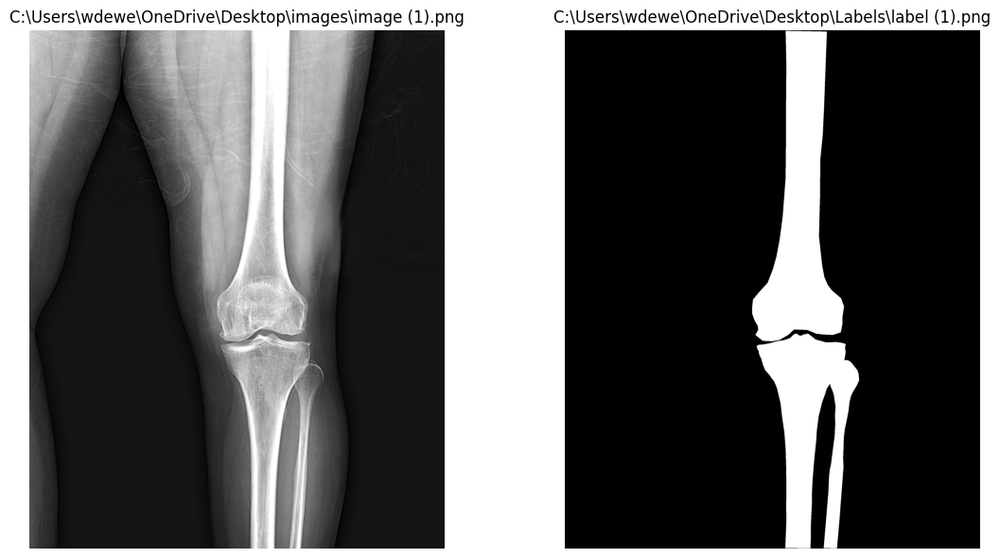

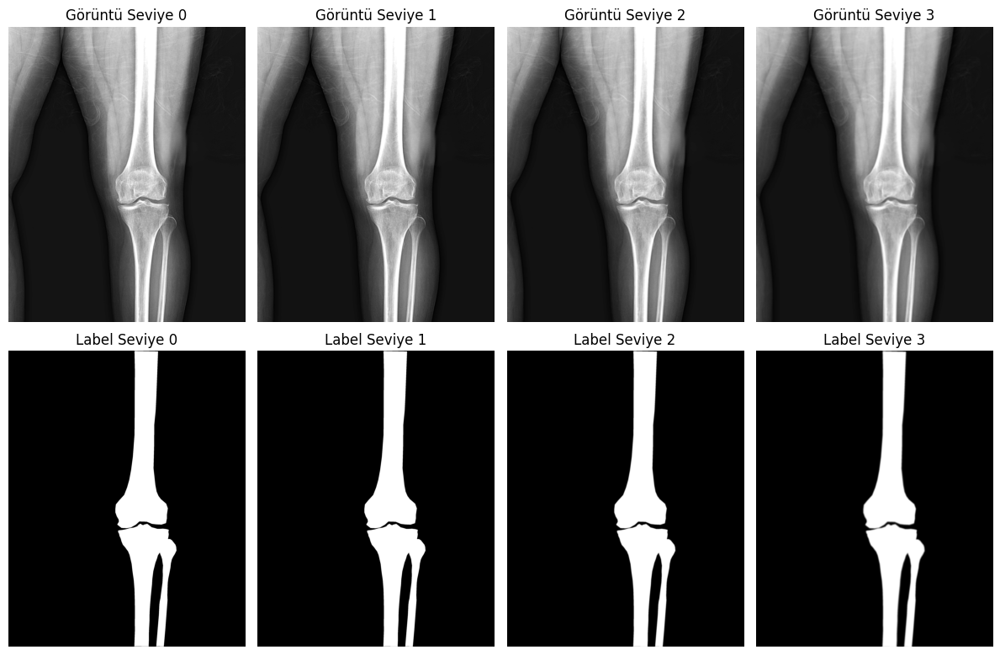


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
img_level_0, img_level_1, img_level_2, img_level_3 = img_pyramid
label_level_0, label_level_1, label_level_2, label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [14]:
#YAZDIRMA FONKSİYONU

In [35]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius=10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color=(255, 255, 0), thickness=2)                                

    if EdgePatchs is not None: 
        # Img üzerine Patch çiz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x, y, PatchSize) in enumerate(EdgePatchs):  # (x, y, PatchSize) bekleniyor
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            cv2.rectangle(output_img, top_left, bottom_right, (0, 0, 255), 2)
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()


In [16]:
#BOUNDARY İLE KENAR NOKTALARINI BULDUK

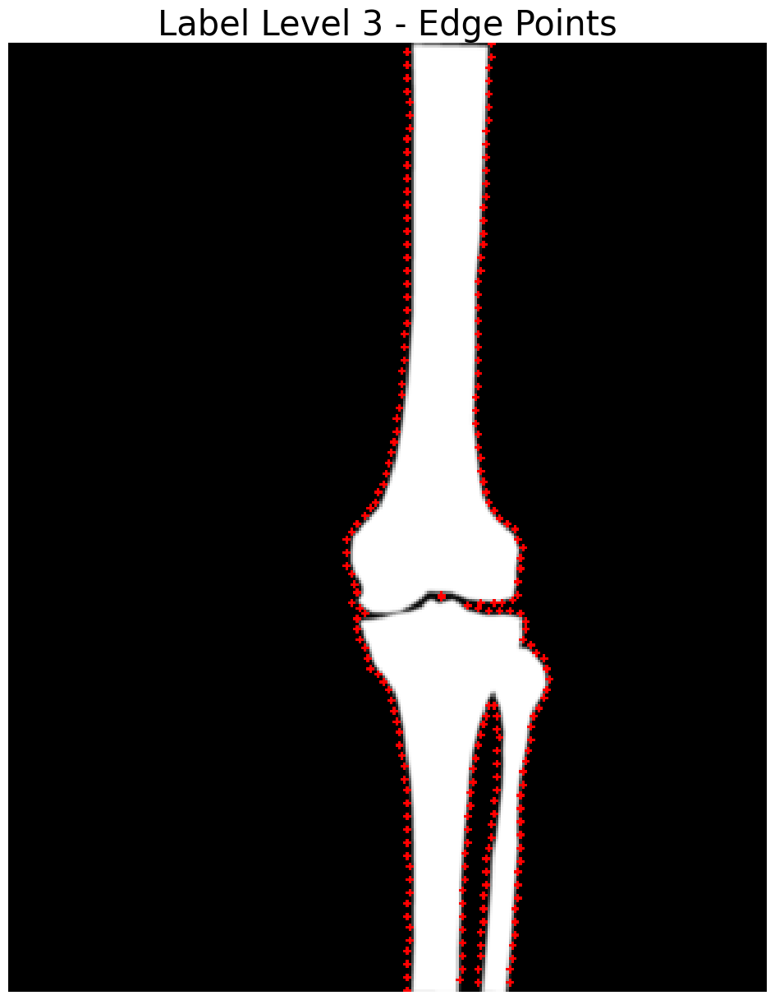

In [36]:
def GetLabelEdgePoints(img, sparsity_factor=1, circle_radius=10, draw=False, title=None):
    contours = measure.find_contours(img, level=0.5)
    # Tüm sınır piksellerini birleştir
    boundary_points = np.vstack(contours)
    
    # Sparsity factor ile seyrekleştirme
    if sparsity_factor > 1:
        boundary_points = boundary_points[::sparsity_factor]
        
    if draw:
        Drawing(img, EdgePoints=boundary_points, circle_radius=circle_radius, title=title)

    return boundary_points.astype(int)

# Kenar Gorsellerini Kodla
title = "Label Level 3 - Edge Points"
img_EdgePoints = GetLabelEdgePoints(label_level_3, sparsity_factor=5, circle_radius=1, draw=True, title=title)


In [37]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title="Drawing", circle_radius=5):
    plt.figure(figsize=(12, 12))
    plt.imshow(img, cmap='gray')
    plt.title(title)
    
    # Noktalar için çizim
    if EdgePoints is not None:
        for y, x in EdgePoints:
            plt.scatter(x, y, c='r', s=10)
    
    # Çizgiler için çizim
    if EdgeLines is not None:
        for (x1, y1), (x2, y2) in EdgeLines:
            plt.plot([x1, x2], [y1, y2], 'b-', lw=1.5)
    
    # Patch'ler için çizim
    if EdgePatchs is not None:
        for k, (x, y, PatchSize, angle) in enumerate(EdgePatchs):  # Dört elemanlı tuple'a uyum
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            rect = plt.Rectangle(top_left, 2 * PatchSize, 2 * PatchSize, linewidth=1, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)

    plt.axis("off")
    plt.show()


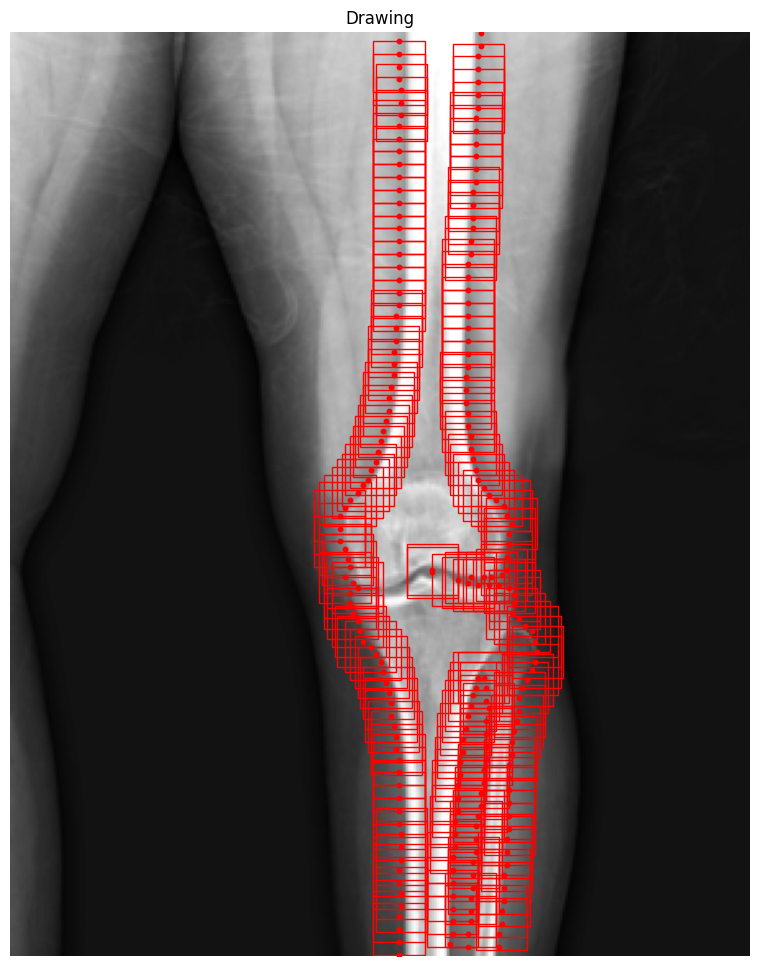

In [38]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo

# img_EdgePoints --> img_EdgePatchs 
img_EdgePatchs, img_EdgePatchsInfo = GetEdgePatchs(img_level_3, img_EdgePoints, PatchSize=10, draw=True)  # M = 2*PatchSize + 1,  MxM = 101x101


In [25]:
#PACHLERİ GÖRSELLEŞTİRİYORUZ

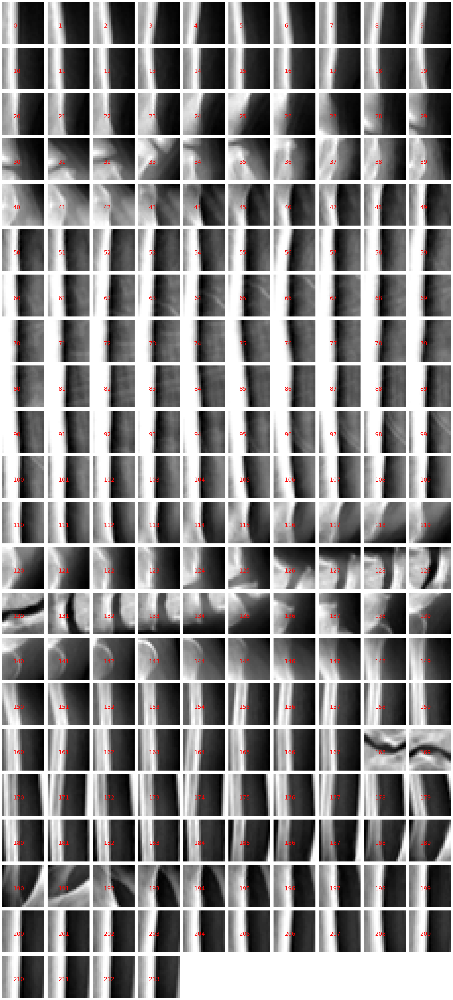

In [39]:
def DisplayPatches(EdgePatchs, max_cols=10):
    # Toplam patch sayısı
    num_patches = len(EdgePatchs)
    
    # Sütun sayısı (max_cols ile sınırlı)
    cols = min(max_cols, num_patches)
    
    # Satır sayısını hesapla
    rows = math.ceil(num_patches / cols)
    
    # Şekil oluşturma
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = np.array(axes).reshape(-1)  # Tek boyutlu diziye dönüştür
    
    for i, ax in enumerate(axes):
        if i < num_patches:
            ax.imshow(EdgePatchs[i], cmap='gray')
            ax.text(5, 10, str(i), color='red', fontsize=18, ha='left', va='top')
            ax.axis('off')
        else:
            ax.axis('off')  # Fazla eksenleri kapat
    
    plt.tight_layout()
    plt.show()


# img_EdgePatchs gorsellerini tek figurede gor (donmusmuyu kontrol et)
DisplayPatches(img_EdgePatchs)

In [26]:
#TÜM PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK

In [40]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

        # Debugging: HOG özelliklerini yazdırma
        #print(f"Patch {i}: HOG Özellikleri: {features[:5]}...")  # İlk 5 özelliği yazdır

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    # Dosya yolu oluşturuluyor
    try:
        # Dizin yoksa oluşturuluyor
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        
        # HOG özellikleri ve koordinatları kaydediliyor
        np.savez(output_path, features=all_features, coords=all_coords)
        print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")
    except Exception as e:
        # Kaydetme sırasında oluşan hatayı yazdır
        print(f"Kaydetme sırasında hata oluştu: {e}")


# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_3  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\hog_features_with_coords.npz"  # Masaüstü yolu

# Hata ayıklamak için görüntülerin ve patch'lerin doğru şekilde geçildiğini kontrol et
print(f"Patch sayısı: {len(img_EdgePatchs)}")
save_hog_features_with_coords(img_EdgePatchs, img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(img_EdgePatchs)} patch HOG ile kodlandı.")


Patch sayısı: 214
HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\hog_features_with_coords.npz
Toplam 214 patch HOG ile kodlandı.


In [28]:
#TEST AŞAMASI

In [29]:
#TEST GÖRSELİNİ ÖN İŞLEMDEN GEÇİRİP GÖRÜNTÜLEDİK
#TEST İÇİN 9. GÖRSELİ KULLANIYORUZ
#HER SEVİYEYİ KENDİ BOYUTUYLA TEST İŞLEMİNE TUTACAĞIZ (3.SEVİYE)

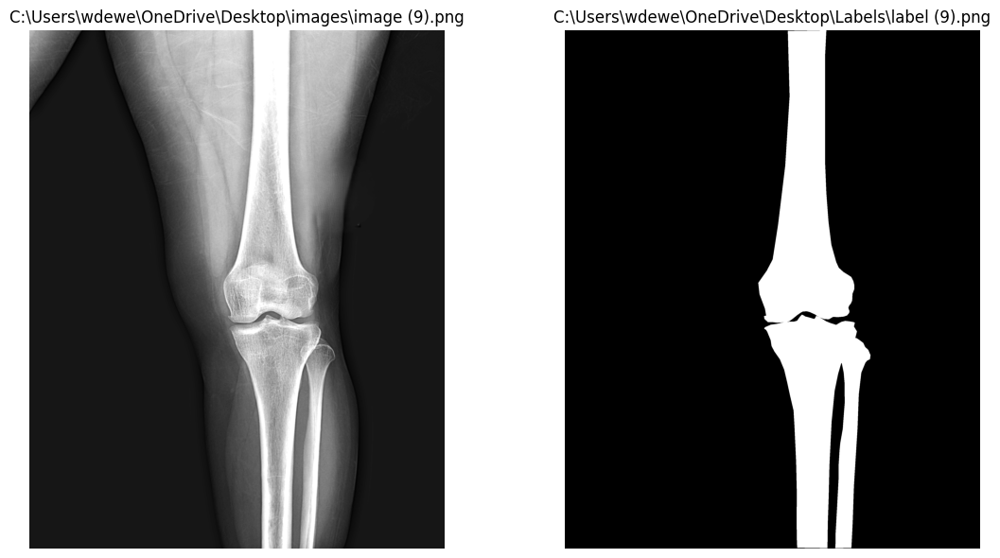

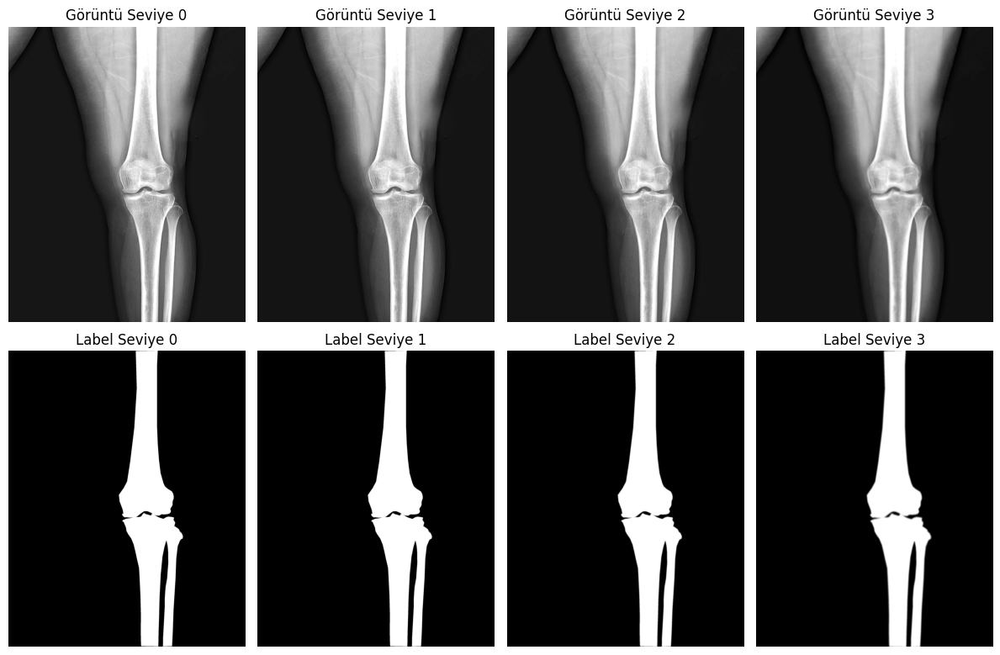


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (9).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (9).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
test_img_level_0, test_img_level_1, test_img_level_2, test_img_level_3 = img_pyramid
test_label_level_0, test_label_level_1, test_label_level_2, test_label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [31]:
#CANNY İLE KENAR NOKTASI ÇIKARMA

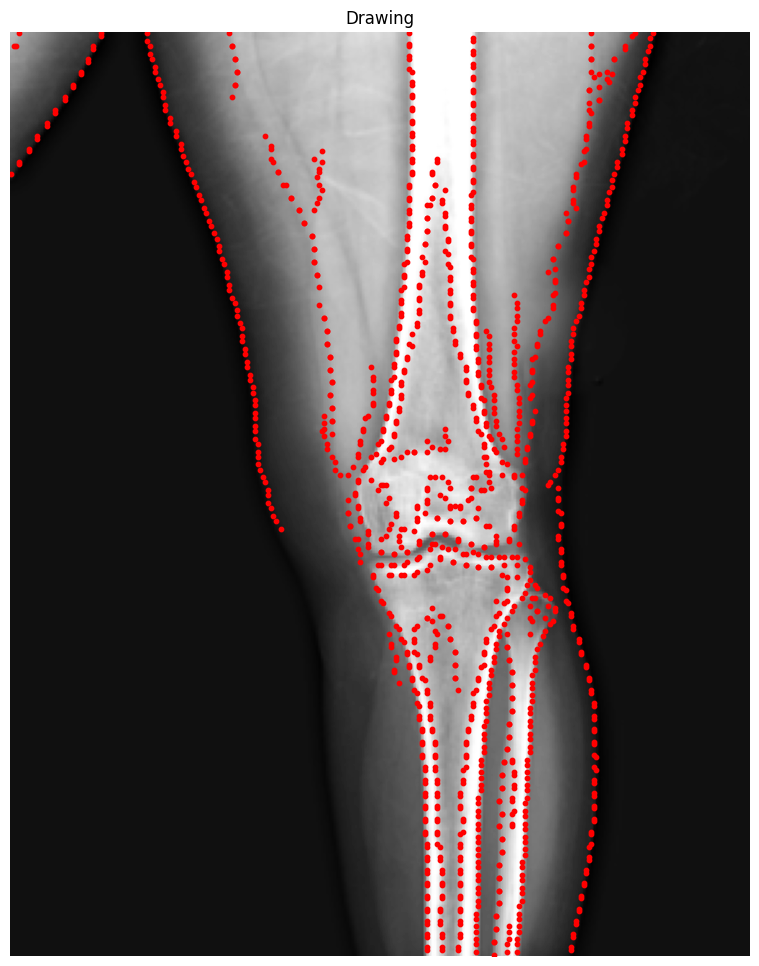

In [42]:
def GetCannyEdgePoints(img, sparsity_factor=1, draw=False):
    blurimg = cv2.GaussianBlur(img, (5, 5), 0)
    edges = cv2.Canny(blurimg, 25, 75)
    CannyEdgePoints, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    EdgePoints = []
    for ObjPoints in CannyEdgePoints:
        EdgePoints = EdgePoints + [(point[0][1], point[0][0]) for i, point in enumerate(ObjPoints) if i % sparsity_factor == 0]

    if draw:
        Drawing(img, EdgePoints=EdgePoints)

    return EdgePoints

test_img_EdgePoints = GetCannyEdgePoints(test_img_level_3, sparsity_factor=5, draw=True)   # EdgePoints --> [p,2] --> (y,x)

In [37]:
#BU NOKTALARDAN PACHLER ALDIK

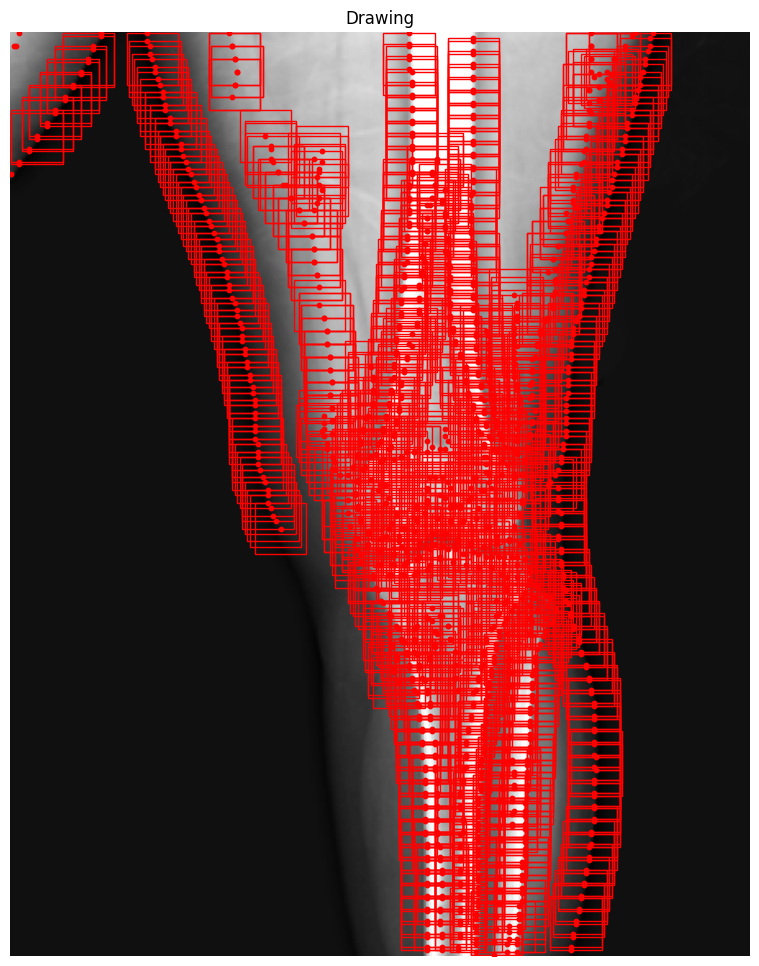

In [43]:
def GetEdgePatchs(img, EdgePoints, PatchSize=11, draw=True):
    EdgePatchs = []
    EdgePatchsInfo = []
    for i in range(len(EdgePoints)):
        # Çizginin başlangıç noktası
        y, x = EdgePoints[i]

        # Çizginin yönü
        prev_idx = (i - 1) % len(EdgePoints)
        next_idx = (i + 1) % len(EdgePoints)
        y1, x1 = EdgePoints[prev_idx]
        y2, x2 = EdgePoints[next_idx]
        dx = x2 - x1
        dy = y2 - y1
        if dx == 0 and dy == 0:
            continue  
        angle = math.atan2(-dx, dy)

        # Patch al
        center = (float(x), float(y))
        rotation_matrix = cv2.getRotationMatrix2D(center, np.degrees(angle), scale=1.0)
        rows, cols = img.shape
        rotated_image = cv2.warpAffine(img, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
        # Patch sınırlarını kontrol et
        y_start, y_end = y - PatchSize, y + PatchSize + 1
        x_start, x_end = x - PatchSize, x + PatchSize + 1

        if y_start < 0 or y_end > rows or x_start < 0 or x_end > cols:
            # Patch görüntü sınırlarının dışında, atla
            continue
                
        EdgePatch = rotated_image[y-PatchSize:y+PatchSize+1, x-PatchSize:x+PatchSize+1]

        EdgePatchs.append(EdgePatch)
        EdgePatchsInfo.append([x,y,PatchSize,np.degrees(angle)])
    
    if draw:
        Drawing(img, EdgePoints=EdgePoints, EdgePatchs = EdgePatchsInfo)        
        
    return EdgePatchs, EdgePatchsInfo


test_img_EdgePatchs, test_img_EdgePatchsInfo = GetEdgePatchs(test_img_level_3, test_img_EdgePoints, PatchSize=10, draw=True)

In [44]:
#ALDIĞIMIZ PACHLERİ HOG İLE KODLAYIP KAYIT ETTİK (Toplam 1200 patch HOG ile kodlandı.)

In [44]:
import cv2
import numpy as np
import os
import math

# HOG özelliklerini hesaplayan fonksiyon
def compute_hog_features(image, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Verilen görüntü için HOG özelliklerini hesaplar.
    """
    hog = cv2.HOGDescriptor(
        _winSize=(image.shape[1] // cell_size[1] * cell_size[1], 
                  image.shape[0] // cell_size[0] * cell_size[0]),
        _blockSize=(block_size[1] * cell_size[1], block_size[0] * cell_size[0]),
        _blockStride=(cell_size[1], cell_size[0]),
        _cellSize=(cell_size[1], cell_size[0]),
        _nbins=nbins
    )
    features = hog.compute(image)
    return features.flatten()

# HOG özelliklerini ve koordinatlarını kaydeden fonksiyon
def save_hog_features_with_coords(patches, patch_info, output_path, cell_size=(8, 8), block_size=(2, 2), nbins=9):
    """
    Patch'lerin HOG özelliklerini ve koordinatlarını HDD'ye kaydeder.
    """
    all_features = []
    all_coords = []

    for i, (patch, info) in enumerate(zip(patches, patch_info)):
        features = compute_hog_features(patch, cell_size, block_size, nbins)
        all_features.append(features)
        all_coords.append(info)

    all_features = np.array(all_features)
    all_coords = np.array(all_coords)

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.savez(output_path, features=all_features, coords=all_coords)
    print(f"HOG özellikleri ve koordinatlar kaydedildi: {output_path}")

# Görüntüyü ve kenar noktalarını al (img_level_1 değişkeni burada kullanılacak)
img = img_level_3  # img_level_1 burada kullanılıyor

# HOG özelliklerini kaydetme
output_file_with_coords = r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\test_image9_hog_features_with_coords.npz"
save_hog_features_with_coords(test_img_EdgePatchs, test_img_EdgePatchsInfo, output_file_with_coords)

# Sonuç olarak toplam kaç patch kodlandığını yazdır
print(f"Toplam {len(test_img_EdgePatchs)} patch HOG ile kodlandı.")


HOG özellikleri ve koordinatlar kaydedildi: C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\test_image9_hog_features_with_coords.npz
Toplam 1200 patch HOG ile kodlandı.


In [46]:
#DOSYADA Kİ KAYITLI KLASÖRÜN ANAHTARINI SORGULAYAN KOD

In [45]:
# Dosyanın içeriğini kontrol etme
hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\test_image9_hog_features_with_coords.npz")
print(hog_data.files)  # Dosyanın içinde hangi anahtarların bulunduğunu gösterir


['features', 'coords']


In [48]:
#HOG KODLARINI CROSS KOLERASYONLA KARŞILAŞTIRDIK.

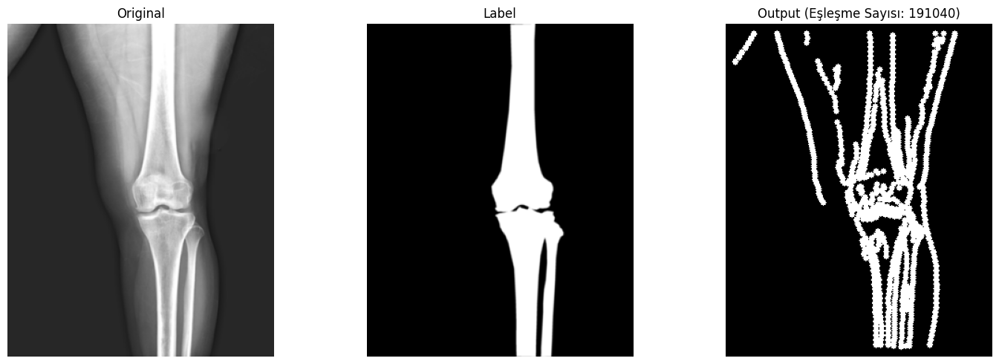

In [47]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Optimize edilmiş çapraz korelasyon fonksiyonu
def compute_cross_correlation_optimized(vectors1, vectors2):
    return 1 - cdist(vectors1, vectors2, metric='correlation')  # Korelasyon mesafesi

# HDD'deki referans HOG vektörlerini yükleme
stored_hog_vectors = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\hog_features_with_coords.npz")['features']

# Test ve etiket görüntülerini daha önceki kodlardan yükleme
test_image = test_img_level_3
label_image = test_label_level_3

# Test HOG vektörlerini ve koordinatlarını yükleme
test_hog_data = np.load(r"C:\Users\wdewe\OneDrive\Belgeler\Dersler\Güncel Dersler\Görüntü İşleme - Biyomedikal Mühendisliği - Bitirme Projesi\Büt\Kodlar\Görüntü İşleme\Piramit (15 Puan)\3_3\test_image9_hog_features_with_coords.npz")
test_hog_vectors = test_hog_data['features']
test_coords = test_hog_data['coords']

# Korelasyon işlemleri ve görselleştirme
plt.figure(figsize=(15, 5))
output_images = []  # Sonuç görsellerini tutmak için bir liste oluştur

# Çapraz korelasyonu hızlı hesaplama
correlations_matrix = compute_cross_correlation_optimized(test_hog_vectors, stored_hog_vectors)
threshold = 0.50
high_correlation_indices = np.argwhere(correlations_matrix >= threshold)

# Yüksek korelasyon eşleşmelerini işleme
output_img = np.zeros_like(test_image)  # Siyah bir görüntü oluşturma
matching_coords_count = 0
for test_idx, stored_idx in high_correlation_indices:
    coord = test_coords[test_idx]
    x, y = int(coord[0]), int(coord[1])
    cv2.circle(output_img, (x, y), 3, (255, 255, 255), -1)
    matching_coords_count += 1

# Orijinal görüntüler ve sonuç görselleştirme
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(label_image, cv2.COLOR_BGR2RGB))
plt.title("Label")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.title(f"Output (Eşleşme Sayısı: {matching_coords_count})")
plt.axis('off')

plt.tight_layout()
plt.show()

# Sonuç görsellerini bir değişkende tutma
final_output_image = output_img  # Son görseli tutan değişken


In [52]:
#FİNAL GÖRÜNTÜSÜNE MORFOLOJİK MÜDAHALELER

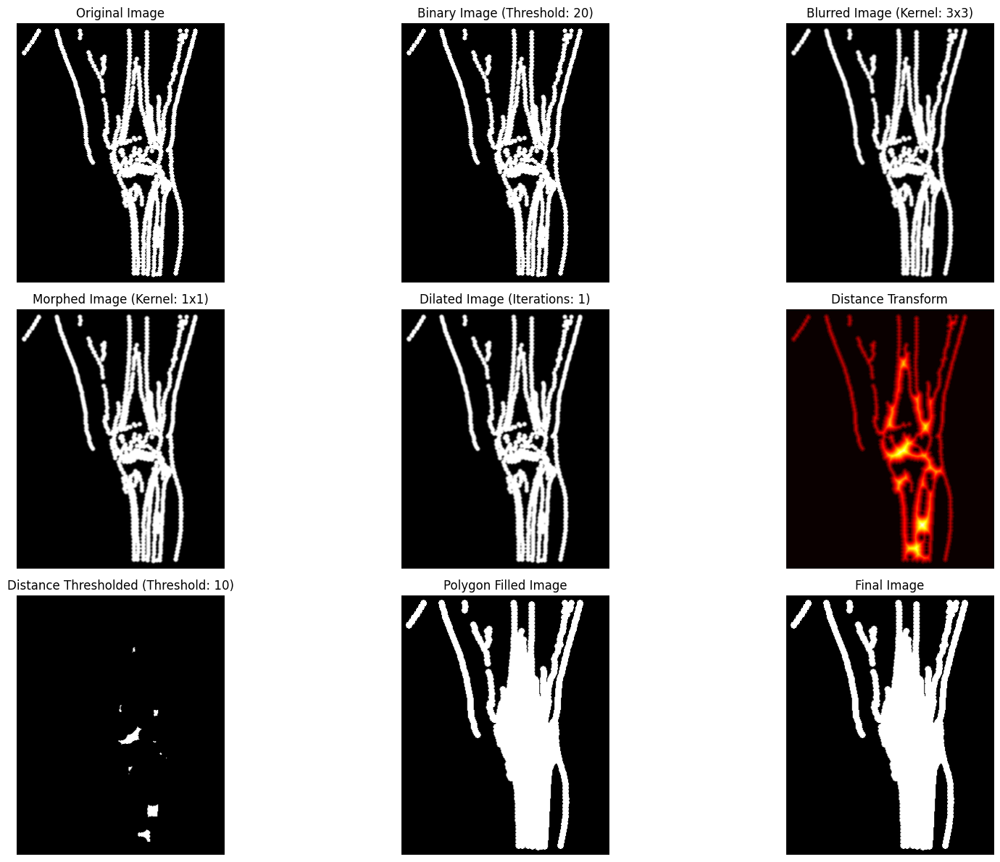

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Görüntüyü yükleme ve gri tonlamaya dönüştürme
if isinstance(final_output_image, np.ndarray):
    if len(final_output_image.shape) == 3:  # Eğer görüntü renkli ise gri tonlamaya dönüştür
        image = cv2.cvtColor(final_output_image, cv2.COLOR_BGR2GRAY)
    else:
        image = final_output_image  # Zaten gri tonlamalı
else:
    image = cv2.imread(final_output_image, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise ValueError("Görüntü yüklenemedi. Lütfen doğru yolu kontrol edin veya geçerli bir NumPy dizisi kullanın.")

# --- Ayarlanabilir Eşik Değerleri ---
threshold_value_initial = 20  # İlk eşik değeri (örneğin kenar tespiti için)
blur_kernel_size = 3          # Bulanıklaştırma için kernel boyutu
morph_kernel_size = 1         # Morfolojik işlemler için kernel boyutu
dilate_iterations = 1         # Dilatasyon iterasyon sayısı
distance_threshold_value = 10 # Distance transform için eşik değeri

# --- Kenarları Tespit Etme ---
_, binary_image = cv2.threshold(image, threshold_value_initial, 255, cv2.THRESH_BINARY)

# --- Bulanıklaştırma ---
blurred_image = cv2.GaussianBlur(binary_image, (blur_kernel_size, blur_kernel_size), 0)

# --- Morfolojik İşlemler: Closing ---
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (morph_kernel_size, morph_kernel_size))
morphed_image = cv2.morphologyEx(blurred_image, cv2.MORPH_CLOSE, kernel)

# --- Dilatasyon ile Noktaları Birleştirme ---
dilated_image = cv2.dilate(morphed_image, kernel, iterations=dilate_iterations)

# --- Distance Transform ---
distance_transform = cv2.distanceTransform(dilated_image, cv2.DIST_L2, 5)
_, distance_thresholded = cv2.threshold(distance_transform, distance_threshold_value, 255, cv2.THRESH_BINARY)
distance_thresholded = distance_thresholded.astype(np.uint8)

# --- Bağlantılı Bileşen Analizi ---
num_labels, labels_im = cv2.connectedComponents(distance_thresholded)

# --- Konturları Bulma ve Poligon Oluşturma ---
contours, _ = cv2.findContours(dilated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
polygon_image = np.zeros_like(dilated_image)

for contour in contours:
    # Konturların içini beyaz yap (poligon şekli)
    cv2.fillPoly(polygon_image, [contour], 255)

# Poligon içindeki alanları beyaz yap
final_image = cv2.bitwise_or(dilated_image, polygon_image)

# --- Sonuçları Görselleştirme ---
plt.figure(figsize=(18, 12))

# Orijinal Görüntü
plt.subplot(3, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# İlk Eşiklenmiş Görüntü
plt.subplot(3, 3, 2)
plt.imshow(binary_image, cmap='gray')
plt.title(f"Binary Image (Threshold: {threshold_value_initial})")
plt.axis('off')

# Bulanıklaştırılmış Görüntü
plt.subplot(3, 3, 3)
plt.imshow(blurred_image, cmap='gray')
plt.title(f"Blurred Image (Kernel: {blur_kernel_size}x{blur_kernel_size})")
plt.axis('off')

# Morfolojik İşlemler Sonrası Görüntü
plt.subplot(3, 3, 4)
plt.imshow(morphed_image, cmap='gray')
plt.title(f"Morphed Image (Kernel: {morph_kernel_size}x{morph_kernel_size})")
plt.axis('off')

# Dilatasyon Sonrası Görüntü
plt.subplot(3, 3, 5)
plt.imshow(dilated_image, cmap='gray')
plt.title(f"Dilated Image (Iterations: {dilate_iterations})")
plt.axis('off')

# Distance Transform Sonrası Görüntü
plt.subplot(3, 3, 6)
plt.imshow(distance_transform, cmap='hot')
plt.title("Distance Transform")
plt.axis('off')

# Distance Threshold Sonrası Görüntü
plt.subplot(3, 3, 7)
plt.imshow(distance_thresholded, cmap='gray')
plt.title(f"Distance Thresholded (Threshold: {distance_threshold_value})")
plt.axis('off')

# Poligon İçinde Beyaz Alanlar
plt.subplot(3, 3, 8)
plt.imshow(polygon_image, cmap='gray')
plt.title("Polygon Filled Image")
plt.axis('off')

# Final Görüntü
plt.subplot(3, 3, 9)
plt.imshow(final_image, cmap='gray')
plt.title("Final Image")
plt.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
#IoU HESAPLAMA

Final Image IoU: 0.4607


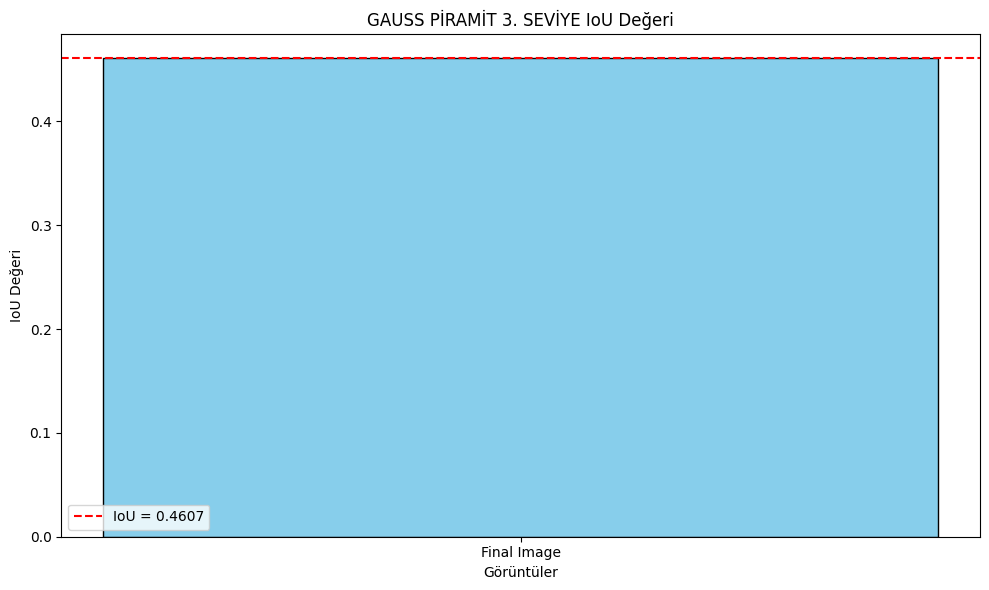

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# IoU hesaplama fonksiyonu
def calculate_iou(predicted_image, label_image):
    # İkili görüntüye dönüştürme (thresholding)
    _, pred_binary = cv2.threshold(predicted_image, 127, 255, cv2.THRESH_BINARY)
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)
    
    # Kesişim ve birleşim
    intersection = np.logical_and(pred_binary > 0, label_binary > 0).sum()
    union = np.logical_or(pred_binary > 0, label_binary > 0).sum()
    
    # IoU hesaplama
    iou = intersection / union if union != 0 else 0
    return iou

# final_image'i kontrol etme
if final_image is None:
    print("Final görüntüsü yüklenemedi!")
else:
    # Eğer final_image zaten gri tonlamalıysa, doğrudan eşikleme yapabilirsiniz
    _, final_binary = cv2.threshold(final_image, 127, 255, cv2.THRESH_BINARY)

# Etiket görüntüsünü yükleme ve kontrol etme
label_image = test_label_level_3  # Etiket görüntüsünün yolu buraya girilmeli
if label_image is None:
    print("Etiket görüntüsü yüklenemedi!")
else:
    # Etiket görüntüsünü ikili hale getirme
    _, label_binary = cv2.threshold(label_image, 127, 255, cv2.THRESH_BINARY)


# IoU hesaplama
if final_image is not None and label_image is not None:
    iou = calculate_iou(final_binary, label_binary)
    print(f"Final Image IoU: {iou:.4f}")

    # IoU Grafik Çıktısı
    plt.figure(figsize=(10, 6))
    plt.bar(["Final Image"], [iou], color='skyblue', edgecolor='black')
    plt.axhline(iou, color='red', linestyle='--', label=f"IoU = {iou:.4f}")
    plt.xlabel('Görüntüler')
    plt.ylabel('IoU Değeri')
    plt.title('GAUSS PİRAMİT 3. SEVİYE IoU Değeri')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [1]:
############################################################################################################################################

In [2]:
#DESEN KODLANIRKEN PİRAMİT GÖRSELLERİNİ KULLANMA

In [3]:
#MODELLEME AŞAMASI

In [4]:
#KÜTÜPHANELERİ İMPORT EDİYORUZ

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import numpy as np
from kymatio import Scattering2D
from skimage import measure

In [6]:
#GÖRSEL VE LABELLERİ ÖN İŞLEMDEN GEÇİRİLEREK GÖRSELLEŞTİRİLİYOR 

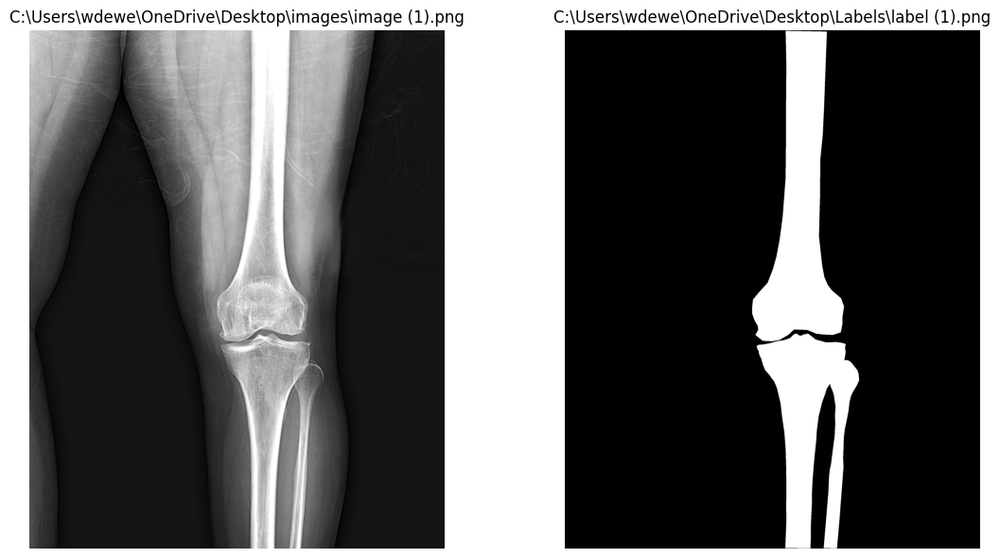

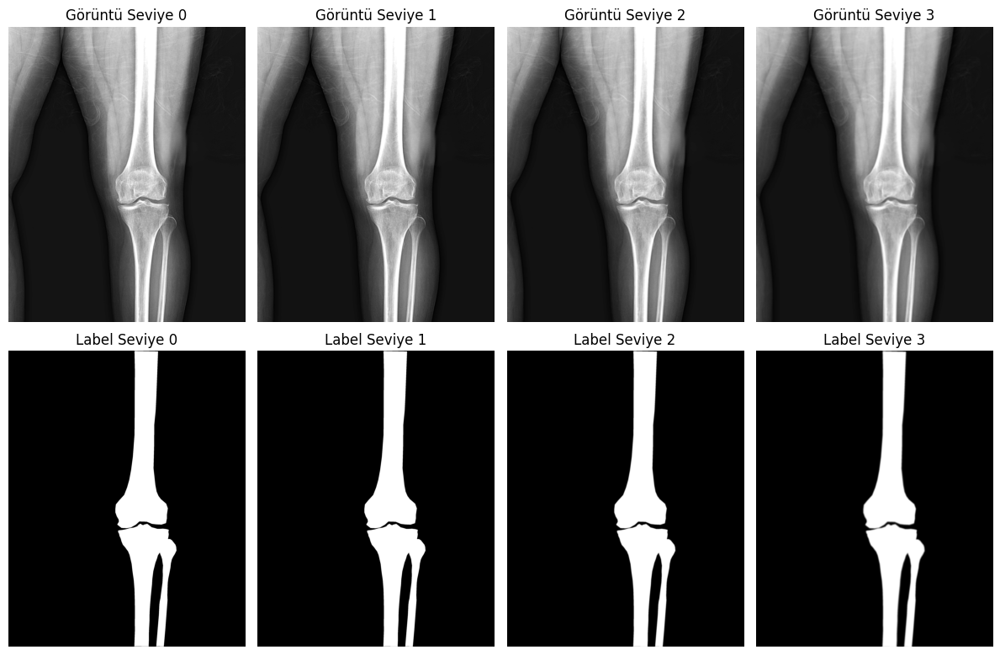


Görüntü seviyelerinin boyutları:
Görüntü Seviye 0: (2880, 2304)
Görüntü Seviye 1: (1440, 1152)
Görüntü Seviye 2: (720, 576)
Görüntü Seviye 3: (360, 288)

Label seviyelerinin boyutları:
Label Seviye 0: (2880, 2304)
Label Seviye 1: (1440, 1152)
Label Seviye 2: (720, 576)
Label Seviye 3: (360, 288)


In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ConvertAndNormalize(img, apply_preprocessing=True):
    # Eğer görüntü renkli ise gri tonlamaya çevir
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # I1 Norm Normalizasyonu
    normalized_image = img / 255.0  # Piksel değerlerini [0, 1] aralığına getir
    normalized_image = (normalized_image * 255).astype(np.uint8)  # [0, 255] aralığına geri çevir
    
    # Ön işleme işlemleri
    if apply_preprocessing:
        # Ortalama (Mean) Filtreleme
        def mean_filter(image, kernel_size=5):
            return cv2.blur(image, (kernel_size, kernel_size))  # Ortalama filtre uygula

        mean_filtered = mean_filter(normalized_image, kernel_size=5)

        # Parlaklık Artırma
        brightness_increase = 20  # Parlaklık artırma miktarı
        brightened_image = cv2.add(mean_filtered, np.full_like(mean_filtered, brightness_increase))

        # Keskinleştirme (Unsharp Masking)
        def sharpen_image(image):
            blurred = cv2.GaussianBlur(image, (5, 5), 1.5)  # Gaussian blur uygula
            sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)  # Keskinleştirme işlemi
            return sharpened

        sharpened_image = sharpen_image(brightened_image)
    
    # Normalize edilmiş görüntü döndürülür
    return sharpened_image

def GetImageLabel(imgStr, labelStr, draw=False):
    img = cv2.imread(imgStr, cv2.IMREAD_GRAYSCALE); img = ConvertAndNormalize(img)
    label = cv2.imread(labelStr, cv2.IMREAD_GRAYSCALE)        
    if draw:
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(imgStr)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(label, cmap='gray')
        plt.title(labelStr)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()  
    return img, label

# img ve label gorselleri al
img, label = GetImageLabel(
    r"C:\Users\wdewe\OneDrive\Desktop\images\image (1).png",
    r"C:\Users\wdewe\OneDrive\Desktop\Labels\label (1).png",
    draw=True
)

# Gauss piramidi oluşturma fonksiyonu
def create_gaussian_pyramid(image, levels=3):
    pyramid = [image]
    for _ in range(levels):
        image = cv2.pyrDown(image)  # Görüntüyü yarıya indir
        pyramid.append(image)
    return pyramid

# img ve label üzerinde Gauss piramidi oluştur
img_pyramid = create_gaussian_pyramid(img, levels=3)
label_pyramid = create_gaussian_pyramid(label, levels=3)

# Piramit seviyelerini ayrı değişkenlerde saklama
img_level_0, img_level_1, img_level_2, img_level_3 = img_pyramid
label_level_0, label_level_1, label_level_2, label_level_3 = label_pyramid

# Sonuçları görselleştirme
plt.figure(figsize=(12, 8))
for level, (pyr_img, pyr_label) in enumerate(zip(img_pyramid, label_pyramid)):
    plt.subplot(2, 4, level + 1)
    plt.imshow(pyr_img, cmap='gray')
    plt.title(f'Görüntü Seviye {level}')
    plt.axis('off')

    plt.subplot(2, 4, level + 5)
    plt.imshow(pyr_label, cmap='gray')
    plt.title(f'Label Seviye {level}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Piramit seviyelerinin boyutlarını yazdırma
print("\nGörüntü seviyelerinin boyutları:")
for level, pyr_image in enumerate(img_pyramid):
    print(f"Görüntü Seviye {level}: {pyr_image.shape}")

print("\nLabel seviyelerinin boyutları:")
for level, pyr_label in enumerate(label_pyramid):
    print(f"Label Seviye {level}: {pyr_label.shape}")


In [8]:
#YAZDIRMA FONKSİYONU

In [52]:
def Drawing(img, EdgePoints=None, EdgeLines=None, EdgePatchs=None, title=None, circle_radius=10):
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)    
       
    if EdgePoints is not None:         
        for point in EdgePoints:
            x, y = int(point[1]), int(point[0])  # x ve y koordinatları ters çevrilir
            cv2.circle(output_img, (x, y), circle_radius, (0, 0, 255), -1)  # Kırmızı daire   

    if EdgeLines is not None: 
        for Line in EdgeLines:
            start_point = Line["StartPointYX"]
            stop_point = Line["StopPointYX"]
            cv2.line(output_img, start_point[::-1], stop_point[::-1], color=(255, 255, 0), thickness=2)                                

    if EdgePatchs is not None: 
        # Img üzerine Patch çiz
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        color = (255, 0, 0)  
        thickness = 2
        for k, (x, y, PatchSize) in enumerate(EdgePatchs):  # (x, y, PatchSize) bekleniyor
            top_left = (x - PatchSize, y - PatchSize)
            bottom_right = (x + PatchSize, y + PatchSize)
            cv2.rectangle(output_img, top_left, bottom_right, (0, 0, 255), 2)
            cv2.putText(output_img, str(k), (x, y - 10), font, font_scale, color, thickness, cv2.LINE_AA)    

    # Görüntü boyutlarına göre figsize hesaplama
    height, width = img.shape[:2]
    aspect_ratio = width / height
    figsize = (15 * aspect_ratio, 15)  # Oranı koruyarak uygun bir ölçekleme

    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    if title is not None:
        plt.title(title, fontsize=30)
    plt.axis('off')
    plt.show()
